In [2]:
from src.utils import read_files_kpi2d, read_file_kpi3d, plot_kpi2d, plot_kpi3d

In [3]:
file_path = '/home/k64889/Masters-Thesis/data/Testing/raw/738561.65_PM180_HPIN_4layer_p4q2_doubleV_pitched_029_000004.xlsx'
#file_path= '/home/k64889/Masters-Thesis/data/AllTopologies/005__ID739469.6978315__PM180_HPIN_4layers_p4q2_SingleV_1V.xlsx'

Plot Exploration of a 2d KPI - Mgrenz

In [3]:
nn_kpi2d, mgrenz_kpi2d = read_files_kpi2d(file_path, 'Mgrenz')

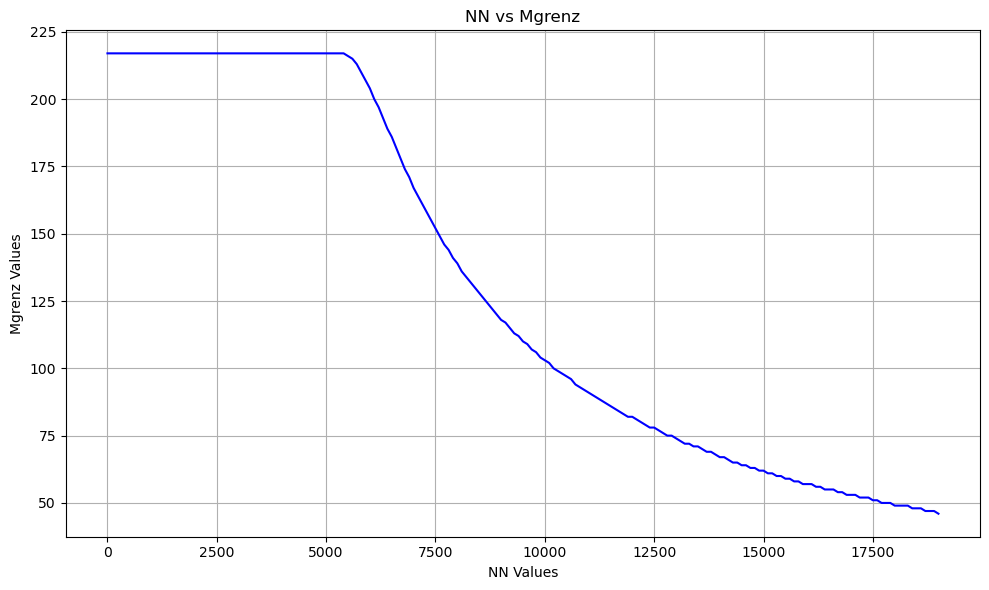

In [4]:
plot_kpi2d(nn_kpi2d, mgrenz_kpi2d)

Plot Exploration of a 3d KPI -ETA

In [4]:
nn_kpi3d = read_file_kpi3d(file_path, 'NN')
mm_kpi3d = read_file_kpi3d(file_path, 'MM')
eta_kpi3d = read_file_kpi3d(file_path, 'ETA')

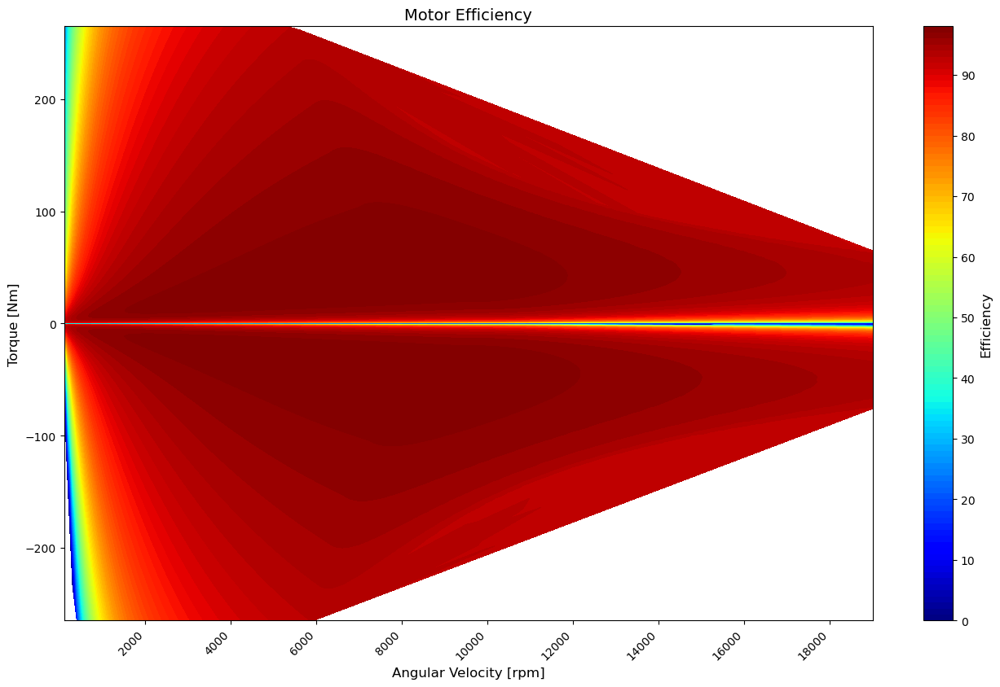

In [5]:
plot_kpi3d(nn_kpi3d, mm_kpi3d, eta_kpi3d)

Reading the tabular data

In [6]:
import pandas as pd

In [7]:
df_inputs=pd.read_csv('./data/TabularDataInputs.csv')

In [17]:
df_inputs.describe()

,lmsov2,lth1v2,lth2v2,r1v2,r11v2,r2v2,r3v2,r4v2,rmt1v2,rmt4v2,...,dhphp,dhpng,N,simQ,r_a,r_i,rad_phiv2,rad_phiv1,rad_phi3b1,rad_phi4b1
count,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,...,1481.000000,1481.000000,1481.0,1481.0,1.481000e+03,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000
mean,-0.000289,0.005395,0.002789,0.002097,0.000326,0.001873,0.000697,0.000747,0.000249,0.000249,...,0.000264,0.000406,4.0,6.0,9.000000e-02,0.064433,-0.511319,-0.694266,-0.002522,-0.000530
std,0.000035,0.000359,0.000178,0.000322,0.000040,0.000133,0.000044,0.000048,0.000016,0.000016,...,0.000014,0.000003,0.0,0.0,2.554375e-15,0.000902,0.063678,0.054700,0.056001,0.011775
min,-0.000300,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000263,0.000406,4.0,6.0,9.000000e-02,0.064000,-0.645772,-0.785398,-1.256637,-0.261799
25%,-0.000300,0.005450,0.002800,0.002200,0.000300,0.001900,0.000700,0.000750,0.000250,0.000250,...,0.000263,0.000406,4.0,6.0,9.000000e-02,0.064000,-0.558505,-0.733038,0.000000,0.000000
50%,-0.000300,0.005450,0.002800,0.002200,0.000300,0.001900,0.000700,0.000750,0.000250,0.000250,...,0.000263,0.000406,4.0,6.0,9.000000e-02,0.064000,-0.523599,-0.698132,0.000000,0.000000
75%,-0.000300,0.005450,0.002800,0.002200,0.000350,0.001900,0.000700,0.000750,0.000250,0.000250,...,0.000263,0.000406,4.0,6.0,9.000000e-02,0.064000,-0.471239,-0.645772,0.000000,0.000000
max,0.000000,0.005450,0.002800,0.002200,0.000600,0.001900,0.000700,0.000750,0.000250,0.000250,...,0.000485,0.000453,4.0,6.0,9.000000e-02,0.067000,0.000000,-0.453786,0.000000,0.000000


In [19]:
# Convert all float columns to float16
df_inputs = df_inputs.apply(lambda x: x.astype('float16') if np.issubdtype(x.dtype, np.floating) else x)

In [20]:
df_inputs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1481 entries, 0 to 1480
Data columns (total 90 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  1481 non-null   object 
 1   lmsov2      1481 non-null   float16
 2   lth1v2      1481 non-null   float16
 3   lth2v2      1481 non-null   float16
 4   r1v2        1481 non-null   float16
 5   r11v2       1481 non-null   float16
 6   r2v2        1481 non-null   float16
 7   r3v2        1481 non-null   float16
 8   r4v2        1481 non-null   float16
 9   rmt1v2      1481 non-null   float16
 10  rmt4v2      1481 non-null   float16
 11  rlt1v2      1481 non-null   float16
 12  rlt4v2      1481 non-null   float16
 13  hav2        1481 non-null   float16
 14  mbv2        1481 non-null   float16
 15  mhv2        1481 non-null   float16
 16  rmagv2      1481 non-null   float16
 17  dsmv2       1481 non-null   float16
 18  dsmuv2      1481 non-null   float16
 19  amtrv2      1481 non-null  

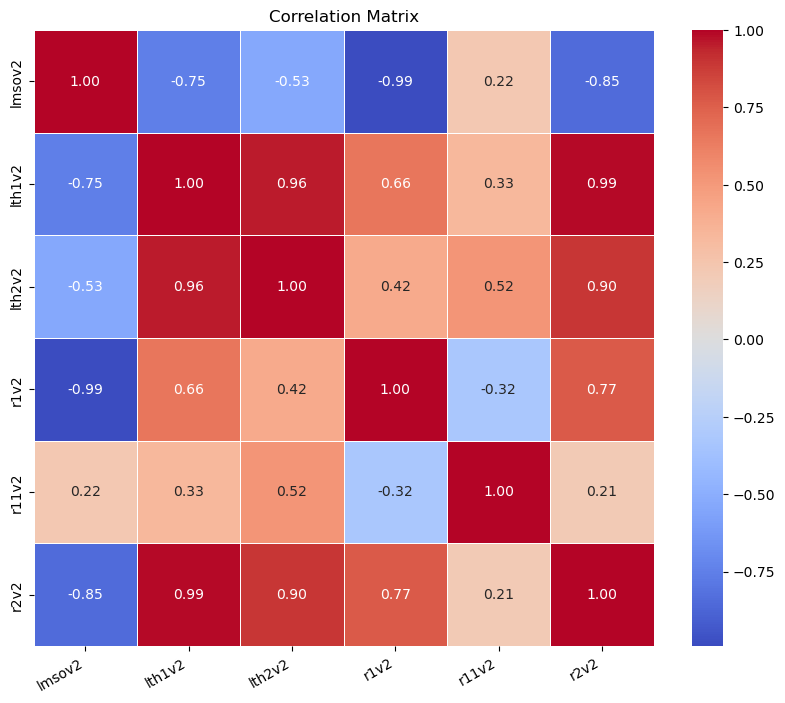

In [21]:
import seaborn as sns
# Assign the columns
columns_of_interest = ['lmsov2', 'lth1v2', 'lth2v2', 'r1v2', 'r11v2', 'r2v2']

# Calculate the correlation matrix
correlation_matrix = df_inputs[columns_of_interest].corr()

# Display the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix')
plt.xticks(rotation=30, ha='right')
plt.show()

In [22]:
df_inputs

,Unnamed: 0,lmsov2,lth1v2,lth2v2,r1v2,r11v2,r2v2,r3v2,r4v2,rmt1v2,...,dhphp,dhpng,N,simQ,r_a,r_i,rad_phiv2,rad_phiv1,rad_phi3b1,rad_phi4b1
0,738562.5564_PM180_HPIN_4layer_p4q2_doubleV_pit...,-0.0002,0.005100,0.0028,0.001200,0.00040,0.0017,0.0007,0.00075,0.00025,...,0.000263,0.000406,4.0,6.0,0.090027,0.067017,-0.453857,-0.645996,0.0,0.0
1,738561.6593_PM180_HPIN_4layer_p4q2_doubleV_pit...,-0.0003,0.005451,0.0028,0.002199,0.00035,0.0019,0.0007,0.00075,0.00025,...,0.000263,0.000406,4.0,6.0,0.090027,0.064026,-0.558594,-0.785156,0.0,0.0
2,738561.7042_PM180_HPIN_4layer_p4q2_doubleV_pit...,-0.0003,0.005451,0.0028,0.002199,0.00030,0.0019,0.0007,0.00075,0.00025,...,0.000263,0.000406,4.0,6.0,0.090027,0.064026,-0.523438,-0.715820,0.0,0.0
3,738561.7173_PM180_HPIN_4layer_p4q2_doubleV_pit...,-0.0003,0.005451,0.0028,0.002199,0.00030,0.0019,0.0007,0.00075,0.00025,...,0.000263,0.000406,4.0,6.0,0.090027,0.064026,-0.506348,-0.732910,0.0,0.0
4,738561.7112_PM180_HPIN_4layer_p4q2_doubleV_pit...,-0.0003,0.005451,0.0028,0.002199,0.00030,0.0019,0.0007,0.00075,0.00025,...,0.000263,0.000406,4.0,6.0,0.090027,0.064026,-0.593262,-0.628418,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1476,738561.6341_PM180_HPIN_4layer_p4q2_doubleV_pit...,-0.0003,0.005451,0.0028,0.002199,0.00035,0.0019,0.0007,0.00075,0.00025,...,0.000263,0.000406,4.0,6.0,0.090027,0.064026,-0.576172,-0.593262,0.0,0.0
1477,738561.6437_PM180_HPIN_4layer_p4q2_doubleV_pit...,-0.0003,0.005451,0.0028,0.002199,0.00035,0.0019,0.0007,0.00075,0.00025,...,0.000263,0.000406,4.0,6.0,0.090027,0.064026,-0.523438,-0.750488,0.0,0.0
1478,738562.5603_PM180_HPIN_4layer_p4q2_doubleV_pit...,-0.0002,0.005100,0.0028,0.001200,0.00040,0.0017,0.0007,0.00075,0.00025,...,0.000263,0.000406,4.0,6.0,0.090027,0.067017,-0.453857,-0.698242,0.0,0.0
1479,738561.6945_PM180_HPIN_4layer_p4q2_doubleV_pit...,-0.0003,0.005451,0.0028,0.002199,0.00030,0.0019,0.0007,0.00075,0.00025,...,0.000263,0.000406,4.0,6.0,0.090027,0.064026,-0.558594,-0.750488,0.0,0.0


In [72]:
# import matplotlib.pyplot as plt
# import matplotlib.pyplot as plt

# for column in df_inputs.columns:
#     plt.figure(figsize=(10, 6))  # Create a figure for each histogram
#     plt.hist(df_inputs[column], bins=30, edgecolor='k')  # Adjust bins as necessary
#     plt.title(f'Histogram for {column}')
#     plt.xlabel(column)
#     plt.ylabel('Frequency')
#     plt.grid(True)
#     plt.show()

In [7]:
df_targets=pd.read_csv('./data/TabularDataTargets.csv')

In [8]:
df_targets

,Unnamed: 0,Column_1,Column_2,Column_3,Column_4,Column_5,Column_6,Column_7,Column_8,Column_9,...,Column_182,Column_183,Column_184,Column_185,Column_186,Column_187,Column_188,Column_189,Column_190,Column_191
0,738562.5564_PM180_HPIN_4layer_p4q2_doubleV_pit...,279,278,278,278,278,278,278,278,278,...,66,65,65,65,64,64,63,63,63,62
1,738561.6593_PM180_HPIN_4layer_p4q2_doubleV_pit...,259,259,259,259,259,259,259,259,259,...,70,69,69,69,68,68,67,67,66,66
2,738561.7042_PM180_HPIN_4layer_p4q2_doubleV_pit...,255,255,255,255,255,255,255,255,255,...,67,66,66,65,65,65,64,64,63,63
3,738561.7173_PM180_HPIN_4layer_p4q2_doubleV_pit...,249,249,249,249,249,249,248,248,248,...,64,63,62,62,62,61,61,60,60,60
4,738561.7112_PM180_HPIN_4layer_p4q2_doubleV_pit...,245,245,245,245,245,245,245,245,245,...,62,62,61,61,60,60,59,59,59,58
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1476,738561.6341_PM180_HPIN_4layer_p4q2_doubleV_pit...,255,255,255,255,255,255,255,255,255,...,67,67,66,66,66,65,65,64,64,63
1477,738561.6437_PM180_HPIN_4layer_p4q2_doubleV_pit...,257,257,257,257,257,257,257,257,257,...,69,68,68,67,67,66,66,66,65,65
1478,738562.5603_PM180_HPIN_4layer_p4q2_doubleV_pit...,278,278,278,278,277,277,277,277,277,...,66,66,65,65,64,64,64,63,63,62
1479,738561.6945_PM180_HPIN_4layer_p4q2_doubleV_pit...,252,251,251,251,251,251,251,251,251,...,66,65,65,64,64,64,63,63,63,62


In [9]:
df_targets.describe()

,Column_1,Column_2,Column_3,Column_4,Column_5,Column_6,Column_7,Column_8,Column_9,Column_10,...,Column_182,Column_183,Column_184,Column_185,Column_186,Column_187,Column_188,Column_189,Column_190,Column_191
count,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,...,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000
mean,257.240378,256.906820,256.896016,256.886563,256.875084,256.860905,256.846725,256.835922,256.818366,256.806887,...,65.884537,65.409858,65.001350,64.553680,64.128967,63.717758,63.280891,62.902768,62.471303,62.088454
std,8.505897,8.473853,8.473727,8.472489,8.470772,8.469155,8.466716,8.465954,8.469187,8.467776,...,2.697253,2.671195,2.660014,2.633462,2.632485,2.598599,2.605756,2.575875,2.562335,2.551816
min,216.000000,215.000000,215.000000,215.000000,215.000000,215.000000,215.000000,215.000000,215.000000,215.000000,...,48.000000,48.000000,48.000000,47.000000,47.000000,47.000000,46.000000,46.000000,46.000000,46.000000
25%,252.000000,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000,...,64.000000,63.000000,63.000000,62.000000,62.000000,62.000000,61.000000,61.000000,60.000000,60.000000
50%,256.000000,256.000000,256.000000,256.000000,256.000000,256.000000,256.000000,256.000000,256.000000,256.000000,...,66.000000,66.000000,65.000000,65.000000,64.000000,64.000000,64.000000,63.000000,63.000000,62.000000
75%,261.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,...,68.000000,68.000000,67.000000,67.000000,66.000000,66.000000,66.000000,65.000000,65.000000,64.000000
max,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,...,70.000000,70.000000,69.000000,69.000000,68.000000,68.000000,67.000000,67.000000,66.000000,66.000000


## 3D KPI - ETA Grid

In [11]:
from src.data_preprocessing_tabular import data_prep_complete

In [12]:
test_size=50
x_normalized, y1_normalized, y2_normalized, scaler_x, scaler_y1, scaler_y2, input_size, output_y1_size, output_y2_size, df_test_inputs, df_test_y1_targets, max_mgrenz=data_prep_complete(test_size)

280


/home/k64889/miniconda3/envs/thesis/lib/python3.10/site-packages/sklearn/utils/_array_api.py:701: RuntimeWarning: All-NaN slice encountered
  return xp.asarray(numpy.nanmin(X, axis=axis))
/home/k64889/miniconda3/envs/thesis/lib/python3.10/site-packages/sklearn/utils/_array_api.py:718: RuntimeWarning: All-NaN slice encountered
  return xp.asarray(numpy.nanmax(X, axis=axis))


1.0000000000000284
-1.0


In [13]:
print(x_normalized.shape)
print(y1_normalized.shape)
print(y2_normalized.shape)

(1431, 89)
(1431, 191)
(1431, 561, 191)


In [ ]:
Training 

In [14]:
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [15]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset
from src.model import mlp_kpi3d
from src.training import mlp_kpi3d_trainer as mlp_kpi3d_trainer, LossRegularisation as loss_regularisation
from sklearn.model_selection import KFold
import wandb
import numpy as np


hidden_sizes = 256
batch_size = 64##try with 72 also
epochs = 10
learning_rate = 0.0075
lambda_loss_regularizer=1.5
splits=5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

kf = KFold(n_splits=splits, shuffle=True, random_state=42)##Goto store splits and load from there to be sure of reproducibiiity
# Store the cross-validation splits
splits_file = 'cross_val_splits.npy'
# splits_indices=kf.split(x_normalized)
# splits_indices = [(train_index, val_index) for train_index, val_index in kf.split(x_normalized)]
# np.save(splits_file, np.array(splits_indices, dtype=object), allow_pickle=True)

# Load the cross-validation splits
splits_indices = np.load(splits_file, allow_pickle=True)

# Lists to store results
cross_train_losses_y1, cross_train_losses_y2 = [], []
cross_val_losses_y1, cross_val_losses_y2 = [], []
cross_train_score_y1, cross_train_score_y2 = [], []
cross_val_score_y1, cross_val_score_y2  = [], []

best_combined_loss = 300
best_y1_score = 10
best_y2_score = 10
best_model = None
best_fold = -1

for fold, (train_index, val_index) in enumerate(splits_indices, 1):
    
    # Initialize wandb with a group to aggregate all runs of each cross-validation fold
    wandb.init(project="EM", config={
        "learning_rate": learning_rate,
        "architecture": "MLP",
        "hidden sizes": hidden_sizes,
        "epochs": epochs,
        }, group="10th Run", name=f"Fold {fold}")
    
    
    # Train-Validation data as per cross val splits
    x_train, x_val = x_normalized[train_index], x_normalized[val_index]
    y1_train, y1_val = y1_normalized[train_index], y1_normalized[val_index]
    y2_train, y2_val = y2_normalized[train_index], y2_normalized[val_index]
    
    train_dataset = TensorDataset(torch.FloatTensor(x_train).to(device), torch.FloatTensor(y1_train).to(device), torch.FloatTensor(y2_train).to(device))
    val_dataset = TensorDataset(torch.FloatTensor(x_val).to(device), torch.FloatTensor(y1_val).to(device), torch.FloatTensor(y2_val).to(device))
    
    y2_shape = (batch_size, y2_train.shape[1], y2_train.shape[2])  
    
    # TODO Then whats the benefit of doing k times?
    model = mlp_kpi3d(input_size, hidden_sizes, output_y1_size, y2_shape)
    #loss = nn.MSELoss()
    
    loss = loss_regularisation(lambda_loss_regularizer)
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    trainer = mlp_kpi3d_trainer(model, train_dataset, val_dataset, batch_size, loss, optimizer, device)
    
    trainer.train(epochs)
    
    wandb.finish()

    cross_train_losses_y1.append(trainer.train_loss_history_y1)
    cross_train_losses_y2.append(trainer.train_loss_history_y2)
    cross_val_losses_y1.append(trainer.val_loss_history_y1)
    cross_val_losses_y2.append(trainer.val_loss_history_y2)
    cross_train_score_y1.append(trainer.train_score_history_y1)
    cross_train_score_y2.append(trainer.train_score_history_y2)
    cross_val_score_y1.append(trainer.val_score_history_y1)
    cross_val_score_y2.append(trainer.val_score_history_y2)
    
    # Combined loss of y1 and y2 per fold
    combined_loss = trainer.val_loss_history_y1[-1] + trainer.val_loss_history_y2[-1]
    
    # Combined loss of y1 and y2 to be the least and r2 score to be as close to 1 as possible
    if combined_loss < best_combined_loss and trainer.val_score_history_y1[-1] < best_y1_score and trainer.val_score_history_y2[-1] < best_y1_score:
        best_combined_loss = combined_loss
        best_y1_score = trainer.val_score_history_y1[-1]
        best_y2_score = trainer.val_score_history_y2[-1]
        print(f"Fold : {fold} Best combined loss: {best_combined_loss} Best y1 score: {best_y1_score} Best y2 score: {best_y2_score}")
        best_model = model
        best_fold = fold

# Calculate average metrics across folds
avg_train_losses_y1 = torch.mean(torch.tensor(cross_train_losses_y1), dim=0)
avg_train_losses_y2 = torch.mean(torch.tensor(cross_train_losses_y2), dim=0)
avg_val_losses_y1 = torch.mean(torch.tensor(cross_val_losses_y1), dim=0)
avg_val_losses_y2 = torch.mean(torch.tensor(cross_val_losses_y2), dim=0)

avg_train_r2_y1 = torch.mean(torch.tensor(cross_train_score_y1), dim=0)
avg_train_r2_y2 = torch.mean(torch.tensor(cross_train_score_y2), dim=0)
avg_val_r2_y1 = torch.mean(torch.tensor(cross_val_score_y1), dim=0)
avg_val_r2_y2 = torch.mean(torch.tensor(cross_val_score_y2), dim=0)

if best_model is not None:
    model.save('./model.pth')
    print(f"Best model saved from fold {best_fold}")
else:
    print("No model met the criteria for saving")


# Print the best fold's performance
print(f"Best fold: {best_fold}")
print(f"Best combined validation loss: {best_combined_loss}")
print(f"Best validation Score for y1: {best_y1_score}")
print(f"Best validation Score for y2: {best_y2_score}")

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: lilly-abraham (lilly-abraham-technische-hochschule-w-rzburg-schweinfurt). Use `wandb login --relogin` to force relogin


train_loss,█▁▁▁▁▁▁▁▁▁
train_loss_y1,█▁▁▁▁▁▁▁▁▁
train_loss_y2,█▁▁▁▁▁▁▁▁▁
train_score_y1,█▂▂▁▂▂▁▂▁▁
train_score_y2,█▁▁▁▁▁▁▁▁▁
val_loss,▅█▃▂▁▁▁▁▁▁
val_loss_y1,█▅▂▂▁▁▁▁▁▁
val_loss_y2,▂█▃▂▂▁▂▁▁▁
val_score_y1,█▄▃▃▁▁▁▁▁▁
val_score_y2,▁█▁▂▃▄▂▂▃▂
train_loss,0.06259


Fold : 1 Best combined loss: 0.004509133096276359 Best y1 score: 0.05491834506392479 Best y2 score: 0.707492470741272


train_loss,█▂▂▂▂▁▁▁▁▁
train_loss_y1,█▃▃▂▃▂▁▁▁▁
train_loss_y2,█▁▁▁▁▁▁▁▁▁
train_score_y1,█▄▃▂▃▃▁▁▁▁
train_score_y2,█▁▁▁▁▁▂▁▁▁
val_loss,▅█▂▁▂▃▁▁▁▁
val_loss_y1,▅█▂▁▂▂▁▁▁▁
val_loss_y2,▅█▅▁▃█▂▂▁▁
val_score_y1,▇█▃▃▂▃▂▁▂▁
val_score_y2,▇▄▃▂▃█▂▂▁▁
train_loss,0.49854


train_loss,█▄▁▁▁▁▁▁▁▁
train_loss_y1,█▄▁▁▁▁▁▁▁▁
train_loss_y2,█▅▁▁▁▁▁▁▁▁
train_score_y1,█▅▂▂▁▁▁▁▁▁
train_score_y2,█▅▂▁▁▁▁▁▁▁
val_loss,█▁▁▁▁▁▁▁▁▁
val_loss_y1,█▁▁▁▁▁▁▁▁▁
val_loss_y2,█▁▂▁▁▁▁▁▁▁
val_score_y1,█▂▂▁▁▁▁▁▁▁
val_score_y2,█▁▂▁▁▁▁▁▁▁
train_loss,0.04841


train_loss,█▂▂▂▁▁▁▁▁▃
train_loss_y1,█▃▅▄▂▁▁▁▂▂
train_loss_y2,█▁▁▁▁▁▁▁▁▃
train_score_y1,█▃▄▃▂▁▁▁▂▂
train_score_y2,█▁▁▁▁▁▁▁▁▂
val_loss,█▇▃▃▃▁▁▂▂▁
val_loss_y1,█▃▂▂▂▁▁▁▁▁
val_loss_y2,▂█▃▃▃▁▂▃▃▂
val_score_y1,█▃▂▂▂▁▁▁▁▁
val_score_y2,█▆▂▁▂▂▂▄▄▃
train_loss,4.58416


train_loss,██▁▁▂▃▂▁▃▂
train_loss_y1,██▂▁▃▃▂▁▁▂
train_loss_y2,█▅▁▁▁▂▁▁█▁
train_score_y1,██▁▁▂▂▂▁▁▂
train_score_y2,█▅▁▁▁▂▁▁▃▁
val_loss,█▂▁▂▁▁▂▂▁▁
val_loss_y1,█▂▂▂▁▁▂▁▁▁
val_loss_y2,▆▁▁▁▁▁▁█▃▂
val_score_y1,█▁▁▂▁▁▁▁▁▁
val_score_y2,█▁▁▁▁▁▁▅▃▂
train_loss,0.93095


Best model saved from fold 1
Best fold: 1
Best combined validation loss: 0.004509133096276359
Best validation Score for y1: 0.05491834506392479
Best validation Score for y2: 0.707492470741272


In [18]:
model.save('./model.pth')

In [19]:
model

mlp_kpi3d(
  (shared_layers): Sequential(
    (0): Linear(in_features=89, out_features=256, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.5, inplace=False)
  )
  (y1_layers): Sequential(
    (0): Linear(in_features=256, out_features=191, bias=True)
  )
  (y2_layers): Sequential(
    (0): Linear(in_features=256, out_features=2048, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.5, inplace=False)
    (3): Linear(in_features=2048, out_features=4096, bias=True)
    (4): ReLU()
    (5): Dropout(p=0.5, inplace=False)
    (6): Linear(in_features=4096, out_features=8192, bias=True)
    (7): ReLU()
    (8): Dropout(p=0.5, inplace=False)
    (9): Linear(in_features=8192, out_features=107151, bias=True)
  )
)

In [20]:
Inference

NameError: name 'a' is not defined

In [20]:
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [ ]:
New files

In [55]:
from src.table_creation import create_tabular_data
import pandas as pd
import os

from tqdm import tqdm

directory = '/home/k64889/Masters-Thesis/data/AllTopologies'

df_test_inputs=pd.DataFrame()
df_test_y1_targets=pd.DataFrame()

for filename in tqdm(os.listdir(directory)):
    file_path = os.path.join(directory, filename)
    df_partial_inputs, df_partial_targets = create_tabular_data(file_path, purpose='test')
    
    if df_partial_inputs is not None:
        df_test_inputs = pd.concat([df_test_inputs, df_partial_inputs])
        
    if df_partial_targets is not None:
        df_test_y1_targets = pd.concat([df_test_y1_targets, df_partial_targets])
        

100%|██████████| 9/9 [02:30<00:00, 16.74s/it]


In [ ]:
With MM

In [21]:
from src.inference import generate_predictions_mm
model_path='./model.pth'
df_predictions_y1, predictions_original_scale_y2, mm, eta_matrix = generate_predictions_mm(model_path, df_test_inputs, df_test_y1_targets, scaler_x, scaler_y1, scaler_y2, device)

Predictions shape: (50, 191)
Predictions shape: (50, 561, 191)


In [13]:
df_test_y1_targets.index

Index(['738562.5614_PM180_HPIN_4layer_p4q2_doubleV_pitched_HMC_020_000013',
       '738561.6696_PM180_HPIN_4layer_p4q2_doubleV_pitched_047_000002',
       '738561.65_PM180_HPIN_4layer_p4q2_doubleV_pitched_029_000004',
       '738561.6576_PM180_HPIN_4layer_p4q2_doubleV_pitched_036_000003',
       '738561.6413_PM180_HPIN_4layer_p4q2_doubleV_pitched_009_000005',
       '738561.7001_PM180_HPIN_4layer_p4q2_doubleV_pitched_074_000010',
       '738611.6026_PM180_HPIN_4layer_p4q2_doubleV_pitched_127_000001',
       '738562.5546_PM180_HPIN_4layer_p4q2_doubleV_pitched_HMC_015_000010',
       '738561.6756_PM180_HPIN_4layer_p4q2_doubleV_pitched_052_000007',
       '738561.6858_PM180_HPIN_4layer_p4q2_doubleV_pitched_061_000010',
       '738561.6351_PM180_HPIN_4layer_p4q2_doubleV_pitched_003_000009',
       '738562.5587_PM180_HPIN_4layer_p4q2_doubleV_pitched_HMC_018_000012',
       '738611.6013_PM180_HPIN_4layer_p4q2_doubleV_pitched_124_000006',
       '738611.6152_PM180_HPIN_4layer_p4q2_doubleV_pit

Sample 0:
Original ETA shape: (544, 191)
Predicted ETA shape: (555, 191)
Original MM shape: (544,)
Predicted MM shape: (555,)


<Figure size 2400x2000 with 0 Axes>

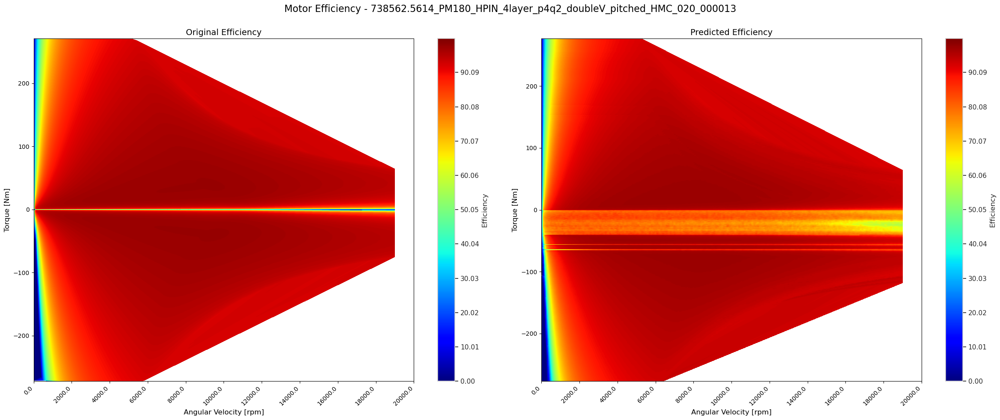

Sample 1:
Original ETA shape: (516, 191)
Predicted ETA shape: (525, 191)
Original MM shape: (516,)
Predicted MM shape: (525,)


<Figure size 2400x2000 with 0 Axes>

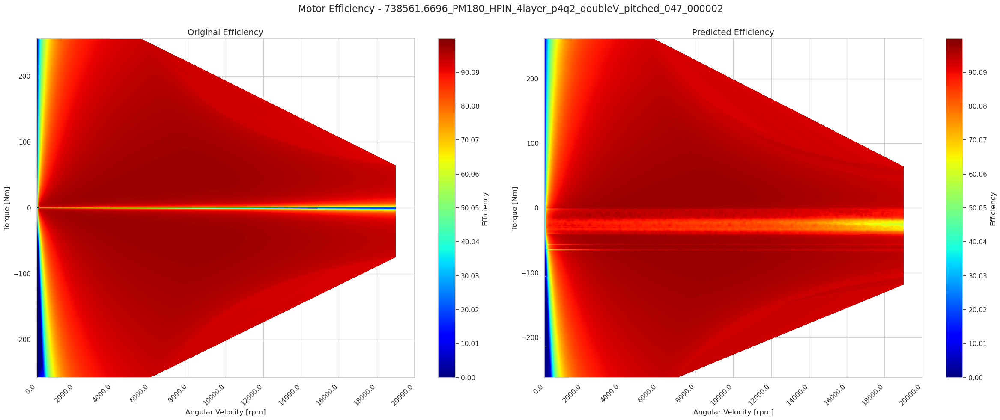

Sample 2:
Original ETA shape: (532, 191)
Predicted ETA shape: (525, 191)
Original MM shape: (532,)
Predicted MM shape: (525,)


<Figure size 2400x2000 with 0 Axes>

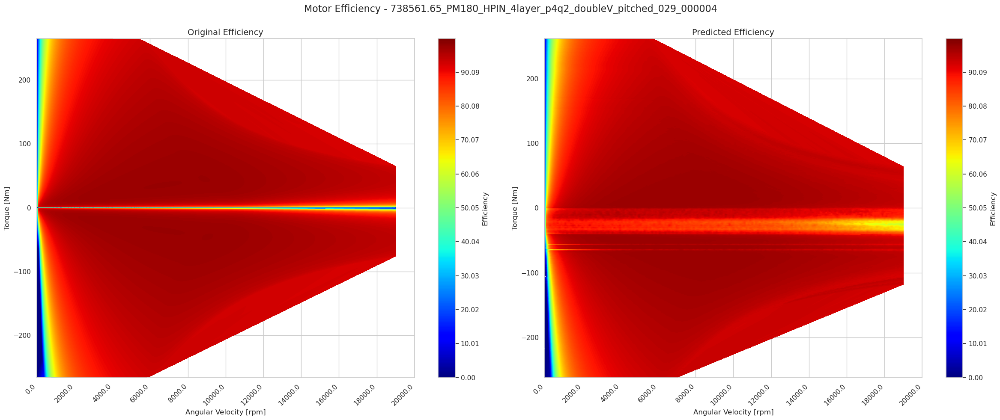

In [22]:
from src.utils import read_file_kpi3d, read_mm_nn
from src.inference import plot_kpi3d_dual_mm
import numpy as np
import matplotlib.pyplot as plt

nn_kpi_2d = list(range(0, 19100, 100))
max_mgrenz_rounded = np.round(max_mgrenz).astype(int)
max_rows = (max_mgrenz_rounded * 2) + 1
nnkpi2darray = np.array(nn_kpi_2d)

max_index = 3

for index_no in range(max_index):
    
    filename_test = df_test_inputs.index[index_no]
    file_path = f'/home/k64889/Masters-Thesis/data/Testing/raw/{filename_test}.xlsx'

    # Read Original MM and ETA data from the Excel file
    mm_kpi3d = np.array(read_mm_nn(file_path, 'MM'))
    eta_kpi3d = read_file_kpi3d(file_path, 'ETA')
    
    eta_predicted = eta_matrix[index_no]
    mm_predicted = np.array(mm[index_no])
    
    print(f"Sample {index_no}:")
    print(f"Original ETA shape: {eta_kpi3d.shape}")
    print(f"Predicted ETA shape: {eta_predicted.shape}")
    print(f"Original MM shape: {mm_kpi3d.shape}")
    print(f"Predicted MM shape: {mm_predicted.shape}")
    
    #Instead of creating a new figure for each plot, add to a grid
    plt.figure(figsize=(24, 20))  # Adjust figure size for all subplots

    # Plot the dual KPI 3D graph
    plot_kpi3d_dual_mm(nnkpi2darray, mm_kpi3d, eta_kpi3d, mm_predicted, eta_predicted, filename_test)

plt.show()

<Figure size 2400x2000 with 0 Axes>

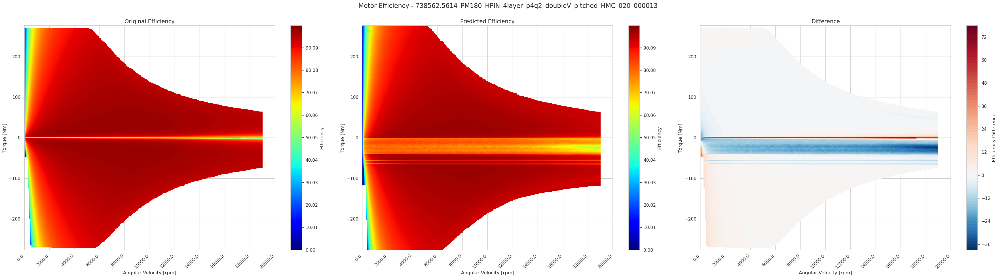

<Figure size 2400x2000 with 0 Axes>

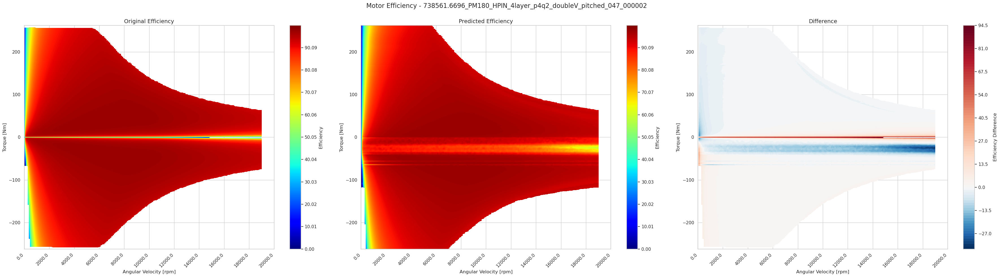

<Figure size 2400x2000 with 0 Axes>

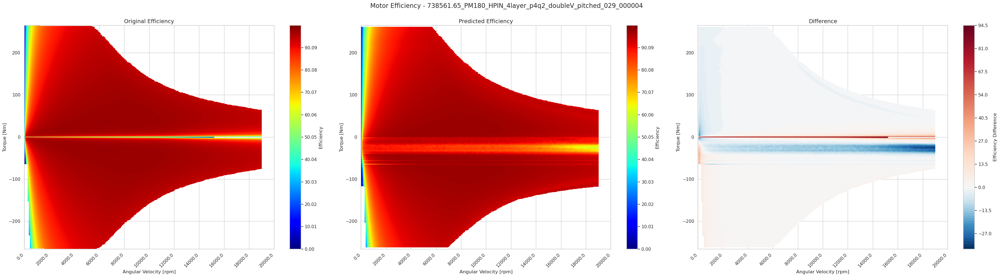

<Figure size 2400x2000 with 0 Axes>

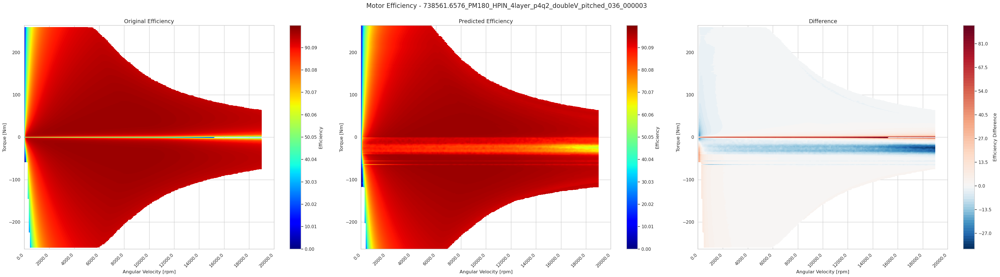

<Figure size 2400x2000 with 0 Axes>

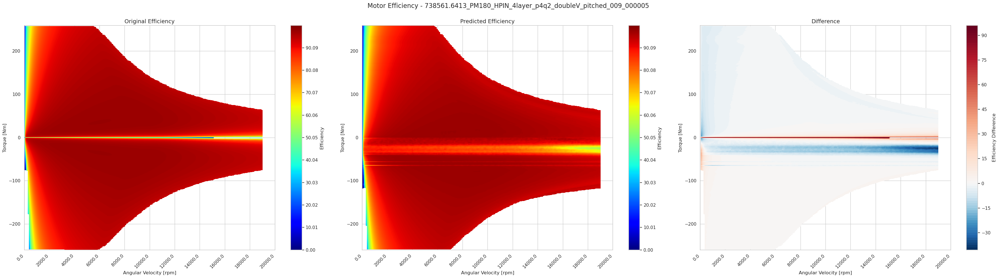

In [23]:
from src.utils import read_file_kpi3d, read_mm_nn
from src.inference import eval_plot_kpi3d_mm
import numpy as np
import matplotlib.pyplot as plt

nn_kpi_2d = list(range(0, 19100, 100))
max_mgrenz_rounded = np.round(max_mgrenz).astype(int)
max_rows = (max_mgrenz_rounded * 2) + 1
nnkpi2darray = np.array(nn_kpi_2d)

max_index = 5

for index_no in range(max_index):
    
    filename_test = df_test_inputs.index[index_no]
    file_path = f'/home/k64889/Masters-Thesis/data/Testing/raw/{filename_test}.xlsx'

    # Read Original MM and ETA data from the Excel file
    #mm_kpi3d = read_file_kpi3d(file_path, 'MM')
    mm_kpi3d = np.array(read_mm_nn(file_path, 'MM'))
    eta_kpi3d = read_file_kpi3d(file_path, 'ETA')
    
    eta_predicted = np.array(eta_matrix[index_no])
    mm_predicted = mm[index_no]
    
    # print(f"Sample {index_no}:")
    # print(f"Original ETA shape: {eta_kpi3d.shape}")
    # print(f"Predicted ETA shape: {eta_predicted.shape}")
    
    #Instead of creating a new figure for each plot, add to a grid
    plt.figure(figsize=(24, 20))  # Adjust figure size for all subplots

    # Plot the dual KPI 3D graph
    eval_plot_kpi3d_mm(nnkpi2darray, mm_kpi3d, eta_kpi3d, mm_predicted, eta_predicted, filename_test)

plt.show()

In [30]:
from src.utils import read_file_kpi3d, read_mm_nn
from src.inference import y2_score_mm
import numpy as np
import matplotlib.pyplot as plt

nn_kpi_2d = list(range(0, 19100, 100))
#nn_kpi_2d = read_mm_nn(file_path, 'NN')
max_mgrenz_rounded = np.round(max_mgrenz).astype(int)
max_rows = (max_mgrenz_rounded * 2) + 1
nnkpi2darray = np.array(nn_kpi_2d)

score=0
max_index = 2

for index_no in range(max_index):
    
    filename_test = df_test_inputs.index[index_no]
    file_path = f'/home/k64889/Masters-Thesis/data/Testing/raw/{filename_test}.xlsx'

    # Read Original MM and ETA data from the Excel file
    mm_kpi3d = np.array(read_mm_nn(file_path, 'MM'))
    eta_kpi3d = read_file_kpi3d(file_path, 'ETA')
    
    eta_predicted = eta_matrix[index_no]
    mm_predicted = np.array(mm[index_no])
    
    # print(f"Sample {index_no}:")
    # print(f"Original ETA shape: {eta_kpi3d.shape}")
    # print(f"Predicted ETA shape: {eta_predicted.shape}")

    # Calculate the Y2 score
    score += y2_score_mm(nnkpi2darray, mm_kpi3d, eta_kpi3d, mm_predicted, eta_predicted)
    
y2_score = score/max_index
print(f"Average Y2 Score: {y2_score:.4f}")

Average Y2 Score: 8.0339


In [ ]:
Inference without considering MM for ETA grid

In [11]:
import pandas as pd
import numpy as np
def generate_predictions(model_path, df_inputs_test, df_targets_test, x_scaler, y1_scaler, y2_scaler, device):
    
    model = torch.load(model_path) # Load the trained model saved locally
    model=model.to(device)
    model.eval()  # Set the model to evaluation mode
    
    index = df_inputs_test.index#Index containing filename

    x_test = df_inputs_test.values
    
    x_test_normalized = x_scaler.transform(x_test)
    x_test_tensor = torch.tensor(x_test_normalized, dtype=torch.float32).to(device)

    with torch.no_grad():
        predictions = model(x_test_tensor) # Generate predictions
        
    predictions_y1 = predictions[0].to('cpu').numpy() # convert to numpy array
    print(f"Predictions shape: {predictions_y1.shape}")
    
    predictions_y2 = predictions[1].to('cpu').numpy() # convert to numpy array
    print(f"Predictions shape: {predictions_y2.shape}")

    target_columns = df_targets_test.columns

    # Inverse transform the predictions to bring back to original scale
    y1 = y1_scaler.inverse_transform(predictions_y1)
   
    ##predictions_rounded = np.round(predictions_original_scale).astype(int)  # Round predictions to nearest integer coz targets are always integers . TODO change tensor type to integer instead of float for y1 labels
    ##Client to take the call
    
    df_y1 = pd.DataFrame(y1, columns=target_columns, index=index)
    
    ##y2

    predictions_y2[predictions_y2 == -1] = np.nan
    
    flattened_predictions_y2 = predictions_y2.reshape(predictions_y2.shape[0], -1) 
    y2 = y2_scaler.inverse_transform(flattened_predictions_y2)  
    y2 = y2.reshape(predictions_y2.shape) 
    
    mm_matrix= []
    eta_matrix=[]
    
    for i in range(y2.shape[0]):
        
        max_mgrenz = df_y1.iloc[i].max()
        max_mgrenz_rounded = np.round(max_mgrenz).astype(int)
        #max_rows = (max_mgrenz_rounded * 2) + 1
        # nnkpi2darray = np.array(nn_kpi_2d)
        # nn_kpi_2d_matrix = np.tile(nnkpi2darray, (max_rows, 1))
        # mm_values = np.arange(-max_mgrenz_rounded, max_mgrenz_rounded + 1)
        # mm_kpi_2d_matrix = np.tile(mm_values.reshape(-1, 1), (1, 191))

        # y2_shape = y2.shape[1:]

        #Padded MM matrix with NAN values
        # padded_mm_kpi_2d_matrix = np.full(y2_shape, np.nan)
        #padded_nn_kpi_2d_matrix = np.full(desired_shape, np.nan)

        # Estimate which parts of the matrix is relevant for each engine
        # start_row = (y2_shape[0] - mm_kpi_2d_matrix.shape[0]) // 2
        # end_row = start_row + mm_kpi_2d_matrix.shape[0]
        
        # padded_mm_kpi_2d_matrix[start_row:end_row, :] = mm_kpi_2d_matrix
        
        #The padded MM matrix is used as a mask to filter out the relevant ETA values
        
        eta_predicted = y2[i]
        # eta_predicted=eta_predicted[mask]
        # eta_predicted_reshaped = eta_predicted.reshape(-1, 191)
        
        # padded_mm_kpi_2d_matrix=padded_mm_kpi_2d_matrix[mask]
        # padded_mm_kpi_2d_matrix_reshaped = padded_mm_kpi_2d_matrix.reshape(-1, 191)
        
        mm_matrix.append(list(range(-max_mgrenz_rounded, max_mgrenz_rounded + 1)))
        eta_matrix.append(eta_predicted)

    return df_y1, y2, mm_matrix, eta_matrix

In [39]:
# from src.inference import generate_predictions
model_path='./model.pth'
df_predictions_y1, predictions_original_scale_y2, mm, eta_matrix = generate_predictions(model_path, df_test_inputs, df_test_y1_targets, scaler_x, scaler_y1, scaler_y2, device)

Predictions shape: (50, 191)
Predictions shape: (50, 561, 191)


In [63]:
eta_matrix[0].shape

(561, 191)

In [21]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
import numpy as np

def plot_kpi3d_dual(nn, mm1, eta1, mm2, eta2, filename):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 10))
    fig.suptitle(f'Motor Efficiency - {filename}', fontsize=16)
    sns.set_theme(style="whitegrid")
    
    Z_global_min = 0.00
    Z_global_max = 100.00
    norm = mcolors.Normalize(vmin=Z_global_min, vmax=Z_global_max)
    levels = np.linspace(Z_global_min, Z_global_max, 1000)
    
    for ax, mm, eta, title in zip([ax1, ax2], [mm1, mm2], [eta1, eta2], ['Original', 'Predicted']):
        
        X, Y = np.meshgrid(nn, mm)
        Z = eta
        
        # Ensure X, Y, and Z have the same shape
        min_rows = min(X.shape[0], Y.shape[0], Z.shape[0])
        X = X[:min_rows, :]
        Y = Y[:min_rows, :]
        Z = Z[:min_rows, :]
        
        mask = np.isfinite(Z)
        X, Y, Z = X[mask], Y[mask], Z[mask]
        
        contour = ax.tricontourf(X.ravel(), Y.ravel(), Z.ravel(), levels=levels, cmap='jet', norm=norm)
        ax.set_xlabel('Angular Velocity [rpm]', fontsize=12)
        ax.set_ylabel('Torque [Nm]', fontsize=12)
        ax.set_title(f'{title} Efficiency', fontsize=14)
        cbar = fig.colorbar(contour, ax=ax)
        cbar.set_label('Efficiency', fontsize=12)
        ax.xaxis.set_major_locator(plt.MaxNLocator(10))
        x_ticks = ax.get_xticks()
        ax.set_xticks(x_ticks)
        ax.set_xticklabels(x_ticks, rotation=45, ha='right')
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.90)
    plt.show()

Sample 0:
Original ETA shape: (544, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (544,)
Predicted MM shape: (559,)
Original MM shape: (544,)
Original ETA shape: (544, 191)
Predicted MM shape: (559,)
Predicted ETA shape: (561, 191)


<Figure size 2400x2000 with 0 Axes>

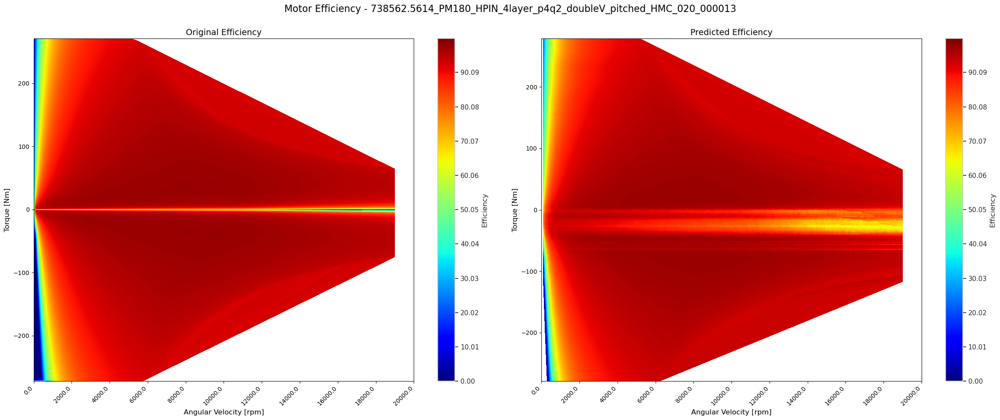

Sample 1:
Original ETA shape: (516, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (516,)
Predicted MM shape: (527,)
Original MM shape: (516,)
Original ETA shape: (516, 191)
Predicted MM shape: (527,)
Predicted ETA shape: (561, 191)


<Figure size 2400x2000 with 0 Axes>

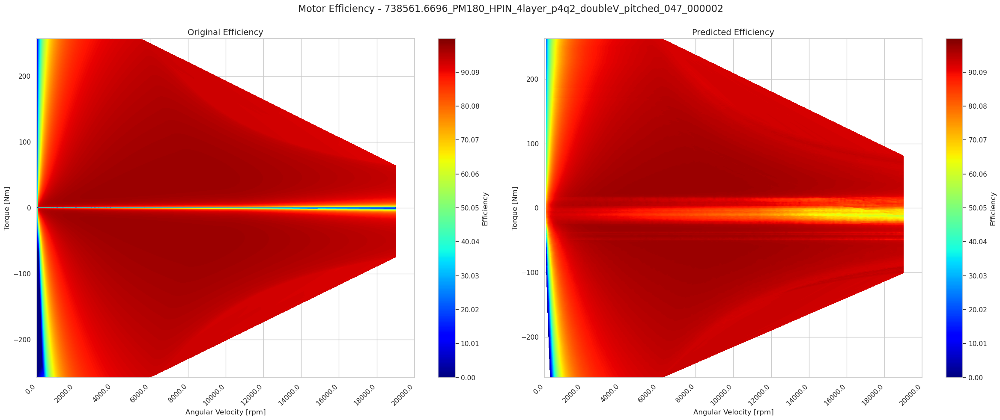

Sample 2:
Original ETA shape: (532, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (532,)
Predicted MM shape: (531,)
Original MM shape: (532,)
Original ETA shape: (532, 191)
Predicted MM shape: (531,)
Predicted ETA shape: (561, 191)


<Figure size 2400x2000 with 0 Axes>

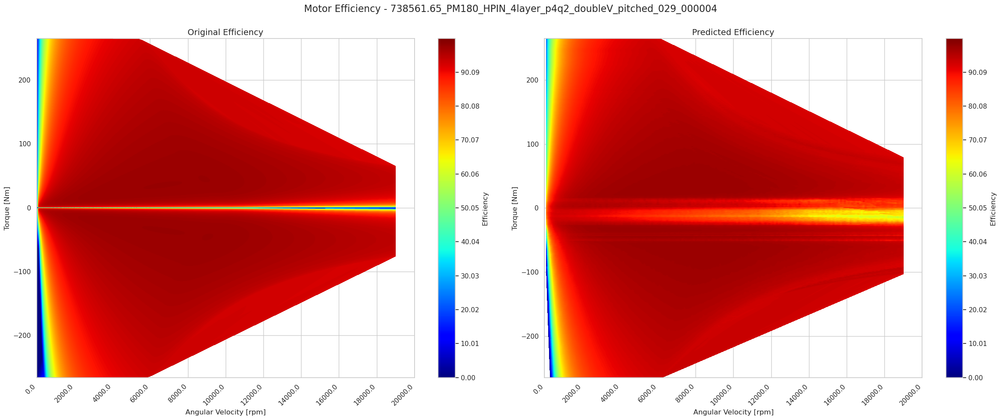

Sample 3:
Original ETA shape: (524, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (524,)
Predicted MM shape: (529,)
Original MM shape: (524,)
Original ETA shape: (524, 191)
Predicted MM shape: (529,)
Predicted ETA shape: (561, 191)


<Figure size 2400x2000 with 0 Axes>

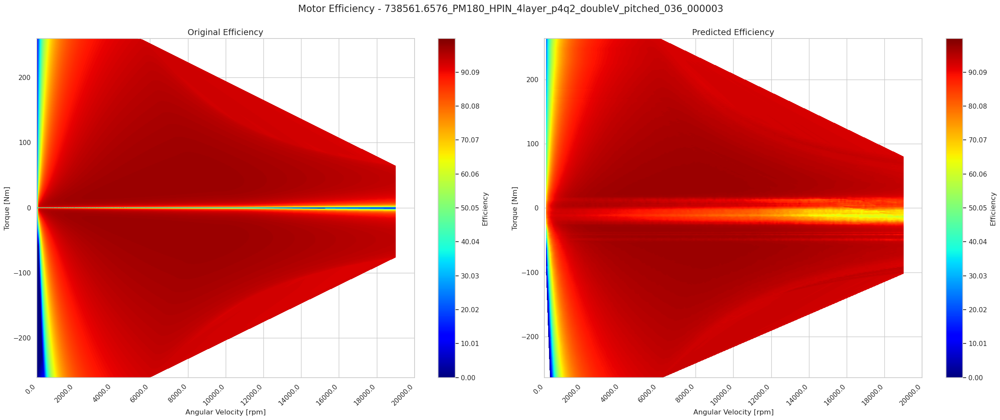

Sample 4:
Original ETA shape: (520, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (520,)
Predicted MM shape: (517,)
Original MM shape: (520,)
Original ETA shape: (520, 191)
Predicted MM shape: (517,)
Predicted ETA shape: (561, 191)


<Figure size 2400x2000 with 0 Axes>

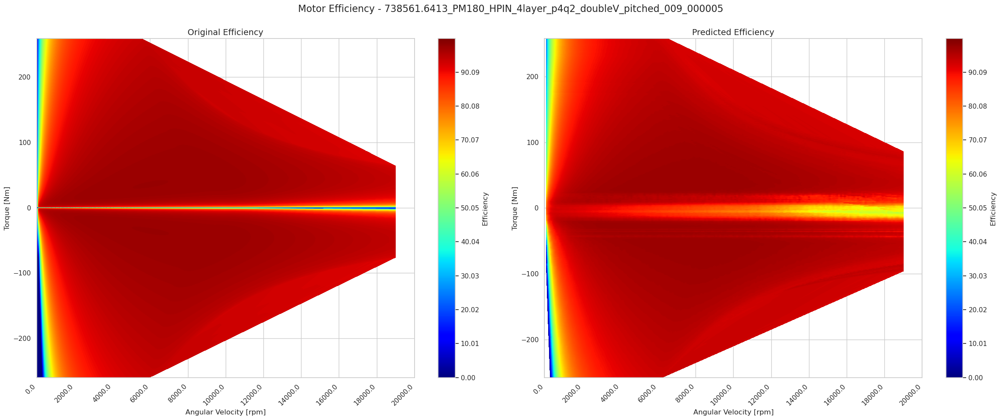

Sample 5:
Original ETA shape: (508, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (508,)
Predicted MM shape: (515,)
Original MM shape: (508,)
Original ETA shape: (508, 191)
Predicted MM shape: (515,)
Predicted ETA shape: (561, 191)


<Figure size 2400x2000 with 0 Axes>

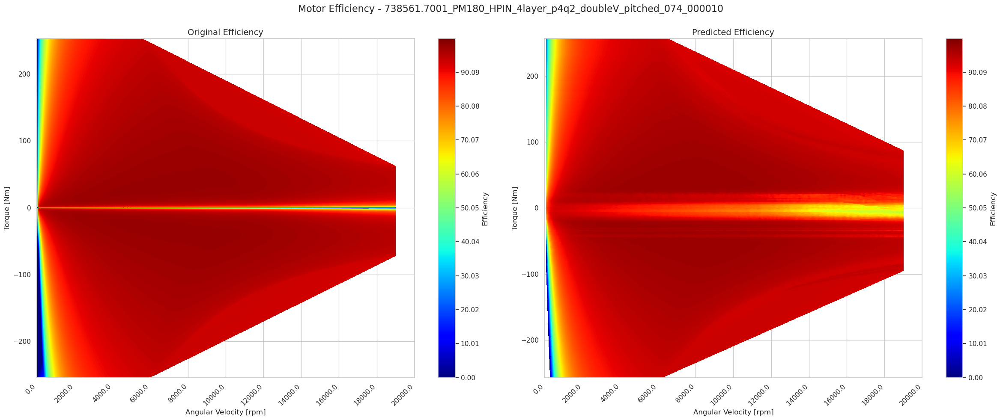

Sample 6:
Original ETA shape: (536, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (536,)
Predicted MM shape: (537,)
Original MM shape: (536,)
Original ETA shape: (536, 191)
Predicted MM shape: (537,)
Predicted ETA shape: (561, 191)


<Figure size 2400x2000 with 0 Axes>

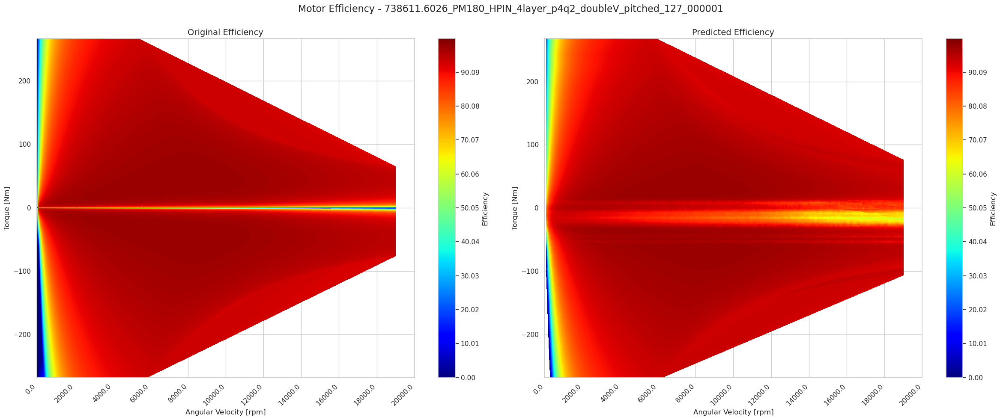

Sample 7:
Original ETA shape: (556, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (556,)
Predicted MM shape: (559,)
Original MM shape: (556,)
Original ETA shape: (556, 191)
Predicted MM shape: (559,)
Predicted ETA shape: (561, 191)


<Figure size 2400x2000 with 0 Axes>

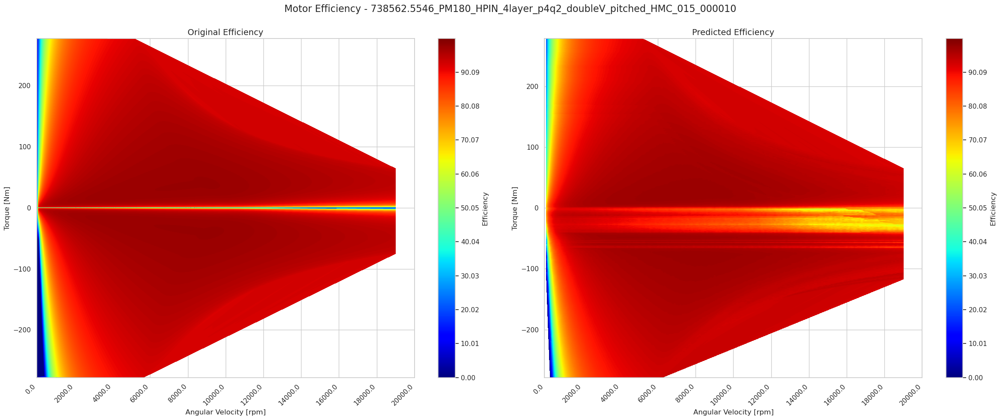

Sample 8:
Original ETA shape: (500, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (500,)
Predicted MM shape: (503,)
Original MM shape: (500,)
Original ETA shape: (500, 191)
Predicted MM shape: (503,)
Predicted ETA shape: (561, 191)


<Figure size 2400x2000 with 0 Axes>

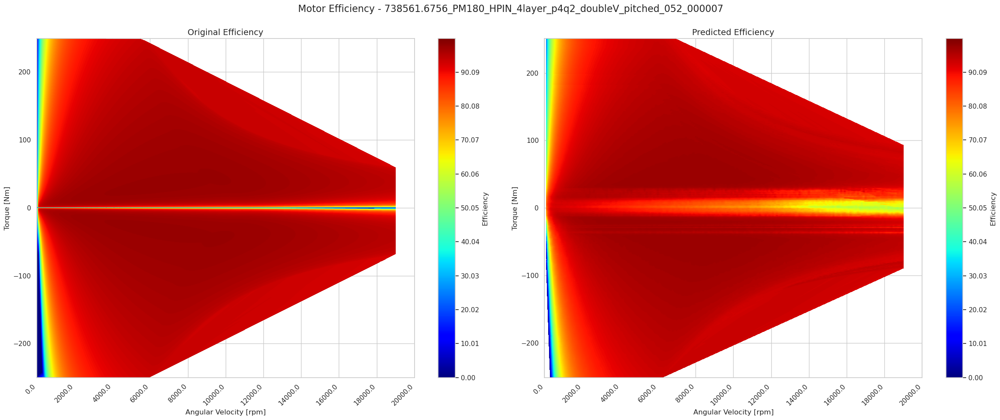

In [22]:
from src.utils import read_file_kpi3d, read_mm_nn
from src.inference import plot_kpi3d_dual_mm
import numpy as np
import matplotlib.pyplot as plt

nn_kpi_2d = list(range(0, 19100, 100))
max_mgrenz_rounded = np.round(max_mgrenz).astype(int)
max_rows = (max_mgrenz_rounded * 2) + 1
nnkpi2darray = np.array(nn_kpi_2d)

max_index = 9

for index_no in range(max_index):
    
    filename_test = df_test_inputs.index[index_no]
    file_path = f'/home/k64889/Masters-Thesis/data/Testing/raw/{filename_test}.xlsx'

    # Read Original MM and ETA data from the Excel file
    mm_kpi3d = np.array(read_mm_nn(file_path, 'MM'))
    eta_kpi3d = read_file_kpi3d(file_path, 'ETA')
    
    eta_predicted = eta_matrix[index_no]
    mm_predicted = np.array(mm[index_no])
    
    print(f"Sample {index_no}:")
    print(f"Original ETA shape: {eta_kpi3d.shape}")
    print(f"Predicted ETA shape: {eta_predicted.shape}")
    print(f"Original MM shape: {mm_kpi3d.shape}")
    print(f"Predicted MM shape: {mm_predicted.shape}")
    
    #Instead of creating a new figure for each plot, add to a grid
    plt.figure(figsize=(24, 20))  # Adjust figure size for all subplots

    # Plot the dual KPI 3D graph
    plot_kpi3d_dual(nnkpi2darray, mm_kpi3d, eta_kpi3d, mm_predicted, eta_predicted, filename_test)

plt.show()

In [23]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
from scipy.interpolate import griddata

def eval_plot_kpi3d(nn, mm1, eta1, mm2, eta2, filename):
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(36, 10))
    fig.suptitle(f'Motor Efficiency - {filename}', fontsize=16)
    sns.set_theme(style="whitegrid")
    
    Z_global_min, Z_global_max = 0.00, 100.00
    norm = mcolors.Normalize(vmin=Z_global_min, vmax=Z_global_max)
    levels = np.linspace(Z_global_min, Z_global_max, 1000)
    
    x_min, x_max = 0, 19000
    y_min = min(np.min(mm1), np.min(mm2))
    y_max = max(np.max(mm1), np.max(mm2))
    
    xi = np.linspace(x_min, x_max, 200)
    yi = np.linspace(y_min, y_max, 1500)##ca change drastically for untrained files..need to then put max_mgrenz from it
    xi, yi = np.meshgrid(xi, yi)
    
    for ax, mm, eta, title in zip([ax1, ax2], [mm1, mm2], [eta1, eta2], ['Original', 'Predicted']):

        # Ensure mm and eta have compatible shapes
        min_rows = min(mm.shape[0], eta.shape[0])
        mm = mm[:min_rows]
        eta = eta[:min_rows, :]
        
        X, Y = np.meshgrid(nn, mm)
        Z = eta
        
        # Flatten and remove any NaN values
        mask = ~np.isnan(Z.ravel())
        points = np.column_stack((X.ravel()[mask], Y.ravel()[mask]))
        values = Z.ravel()[mask]
        
        # Interpolate data onto the common grid
        zi = griddata(points, values, (xi, yi), method='linear')
        
        contour = ax.contourf(xi, yi, zi, levels=levels, cmap='jet', norm=norm)
        ax.set_xlabel('Angular Velocity [rpm]', fontsize=12)
        ax.set_ylabel('Torque [Nm]', fontsize=12)
        ax.set_title(f'{title} Efficiency', fontsize=14)
        cbar = fig.colorbar(contour, ax=ax)
        cbar.set_label('Efficiency', fontsize=12)
        ax.xaxis.set_major_locator(plt.MaxNLocator(10))
        x_ticks = ax.get_xticks()
        ax.set_xticks(x_ticks)
        ax.set_xticklabels(x_ticks, rotation=45, ha='right')
    
    # Calculate and plot the difference
    min_rows1 = min(mm1.shape[0], eta1.shape[0])
    min_rows2 = min(mm2.shape[0], eta2.shape[0])
    
    X1, Y1 = np.meshgrid(nn, mm1[:min_rows1])
    X2, Y2 = np.meshgrid(nn, mm2[:min_rows2])
    
    mask1 = ~np.isnan(eta1[:min_rows1, :].ravel())
    mask2 = ~np.isnan(eta2[:min_rows2, :].ravel())
    
    points1 = np.column_stack((X1.ravel()[mask1], Y1.ravel()[mask1]))
    points2 = np.column_stack((X2.ravel()[mask2], Y2.ravel()[mask2]))
    
    Z1 = griddata(points1, eta1[:min_rows1, :].ravel()[mask1], (xi, yi), method='linear')
    Z2 = griddata(points2, eta2[:min_rows2, :].ravel()[mask2], (xi, yi), method='linear')
    
    Z_diff = Z2 - Z1
    diff_norm = mcolors.TwoSlopeNorm(vmin=np.nanmin(Z_diff), vcenter=0, vmax=np.nanmax(Z_diff))
    diff_contour = ax3.contourf(xi, yi, Z_diff, levels=100, cmap='RdBu_r', norm=diff_norm)
    ax3.set_xlabel('Angular Velocity [rpm]', fontsize=12)
    ax3.set_ylabel('Torque [Nm]', fontsize=12)
    ax3.set_title('Difference', fontsize=14)
    cbar_diff = fig.colorbar(diff_contour, ax=ax3)
    cbar_diff.set_label('Efficiency Difference', fontsize=12)
    ax3.xaxis.set_major_locator(plt.MaxNLocator(10))
    x_ticks = ax3.get_xticks()
    ax3.set_xticks(x_ticks)
    ax3.set_xticklabels(x_ticks, rotation=45, ha='right')
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.90)
    plt.show()

Sample 0:
Original ETA shape: (544, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (544,)
Predicted MM shape: (559,)


<Figure size 2400x2000 with 0 Axes>

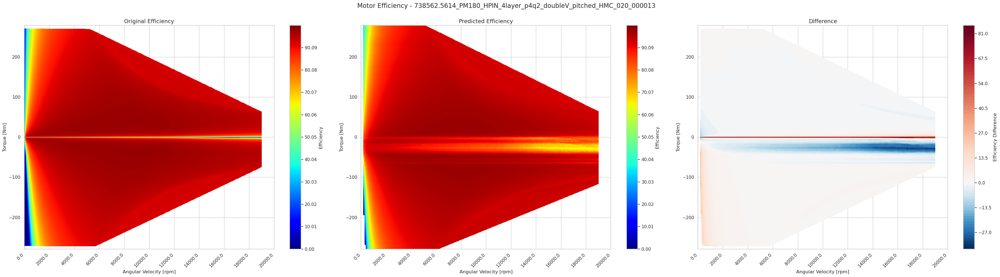

Sample 1:
Original ETA shape: (516, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (516,)
Predicted MM shape: (527,)


<Figure size 2400x2000 with 0 Axes>

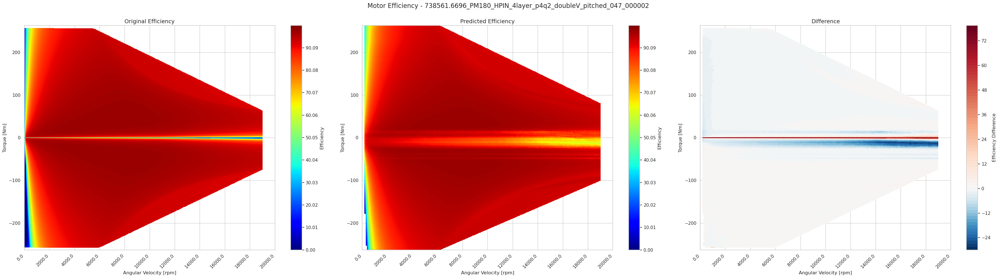

Sample 2:
Original ETA shape: (532, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (532,)
Predicted MM shape: (531,)


<Figure size 2400x2000 with 0 Axes>

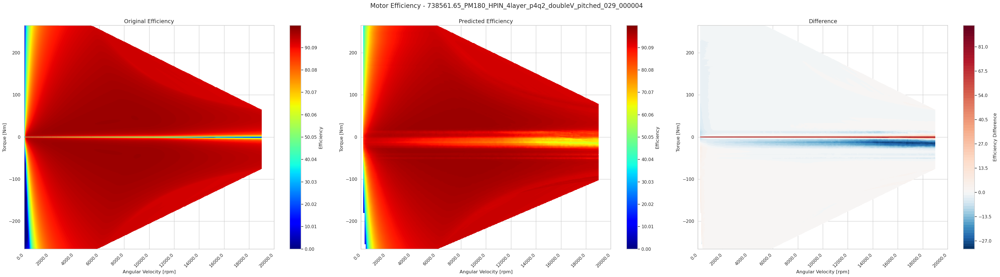

Sample 3:
Original ETA shape: (524, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (524,)
Predicted MM shape: (529,)


<Figure size 2400x2000 with 0 Axes>

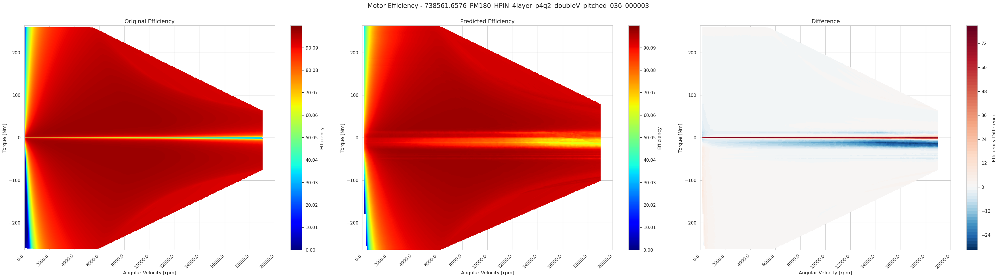

Sample 4:
Original ETA shape: (520, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (520,)
Predicted MM shape: (517,)


<Figure size 2400x2000 with 0 Axes>

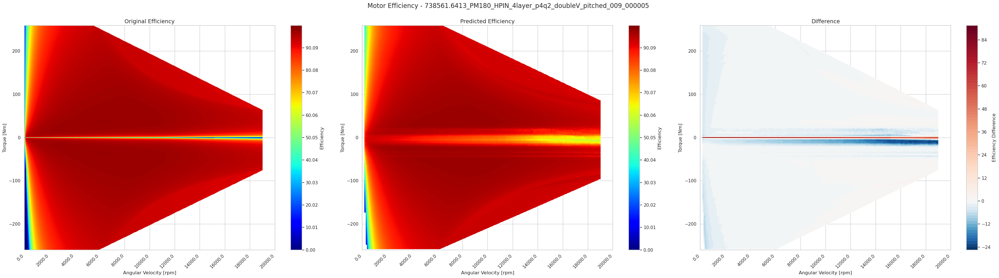

Sample 5:
Original ETA shape: (508, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (508,)
Predicted MM shape: (515,)


<Figure size 2400x2000 with 0 Axes>

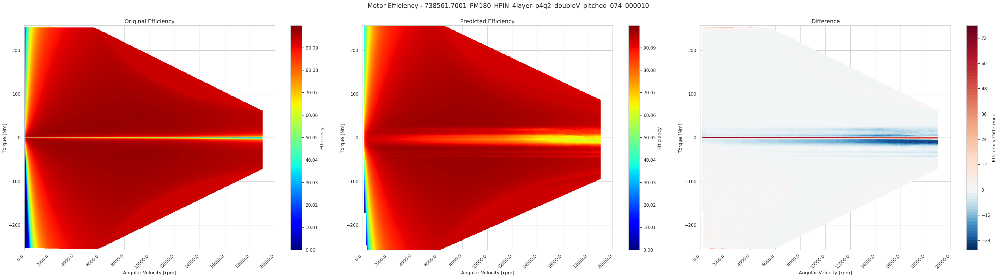

Sample 6:
Original ETA shape: (536, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (536,)
Predicted MM shape: (537,)


<Figure size 2400x2000 with 0 Axes>

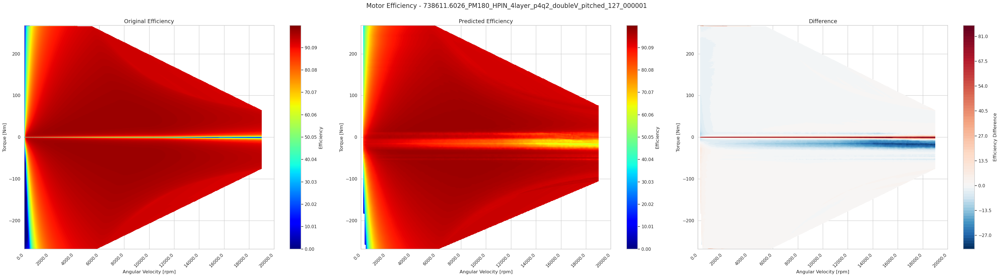

Sample 7:
Original ETA shape: (556, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (556,)
Predicted MM shape: (559,)


<Figure size 2400x2000 with 0 Axes>

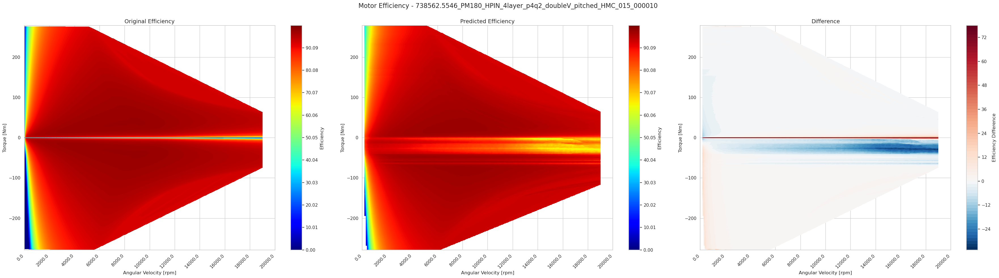

Sample 8:
Original ETA shape: (500, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (500,)
Predicted MM shape: (503,)


<Figure size 2400x2000 with 0 Axes>

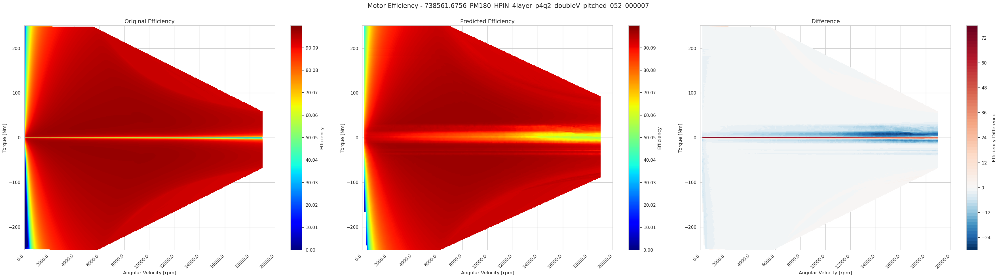

Sample 9:
Original ETA shape: (506, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (506,)
Predicted MM shape: (511,)


<Figure size 2400x2000 with 0 Axes>

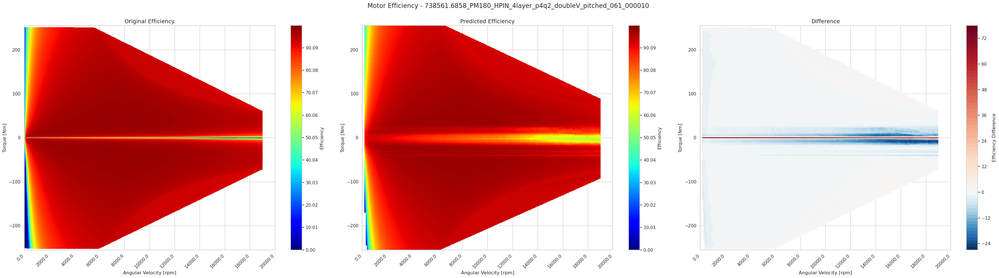

Sample 10:
Original ETA shape: (518, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (518,)
Predicted MM shape: (523,)


<Figure size 2400x2000 with 0 Axes>

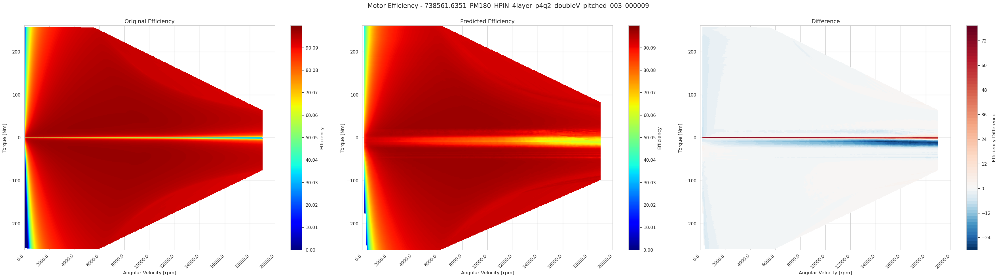

Sample 11:
Original ETA shape: (550, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (550,)
Predicted MM shape: (557,)


<Figure size 2400x2000 with 0 Axes>

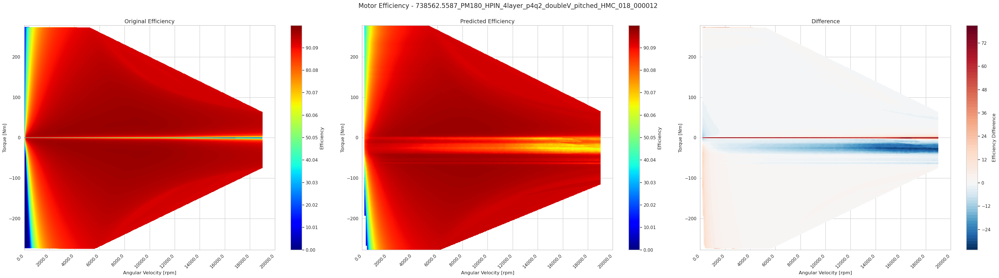

Sample 12:
Original ETA shape: (532, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (532,)
Predicted MM shape: (533,)


<Figure size 2400x2000 with 0 Axes>

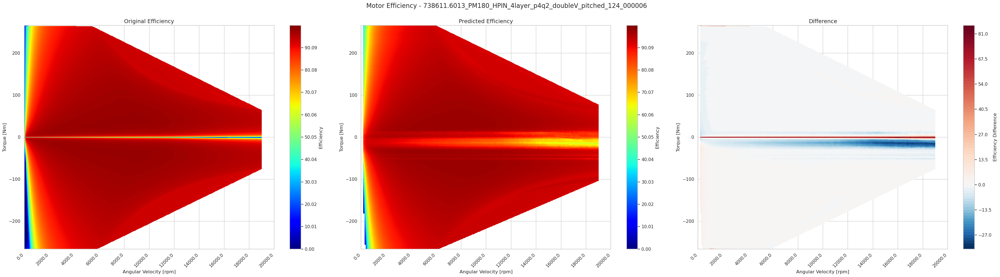

Sample 13:
Original ETA shape: (528, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (528,)
Predicted MM shape: (521,)


<Figure size 2400x2000 with 0 Axes>

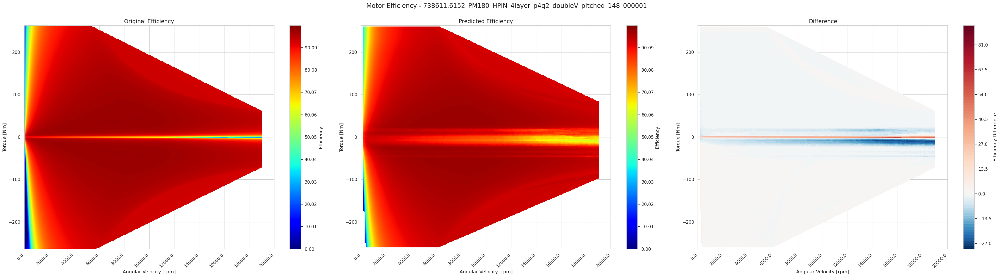

Sample 14:
Original ETA shape: (530, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (530,)
Predicted MM shape: (531,)


<Figure size 2400x2000 with 0 Axes>

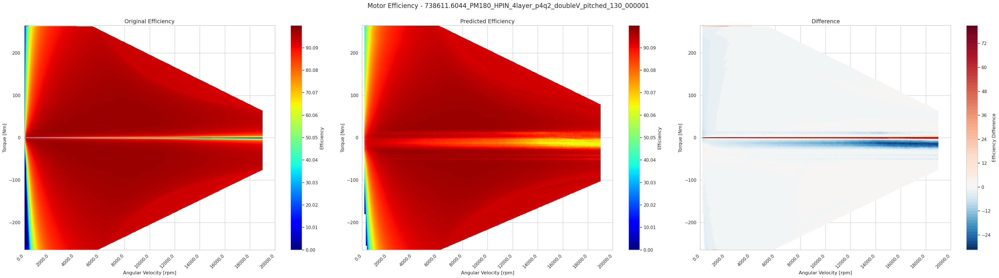

Sample 15:
Original ETA shape: (502, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (502,)
Predicted MM shape: (513,)


<Figure size 2400x2000 with 0 Axes>

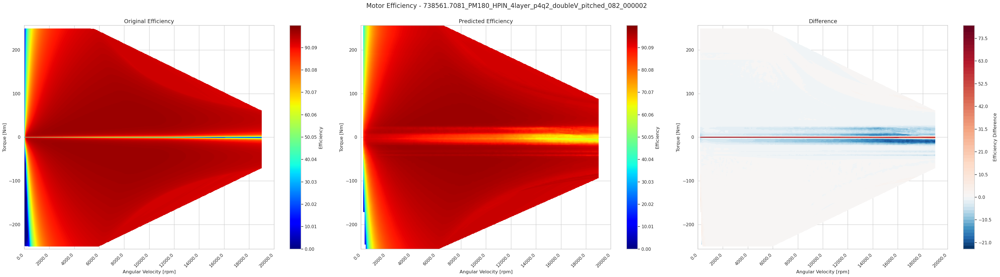

Sample 16:
Original ETA shape: (522, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (522,)
Predicted MM shape: (517,)


<Figure size 2400x2000 with 0 Axes>

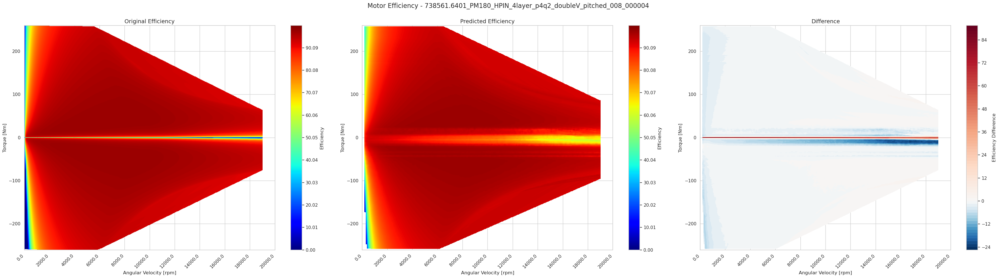

Sample 17:
Original ETA shape: (552, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (552,)
Predicted MM shape: (549,)


<Figure size 2400x2000 with 0 Axes>

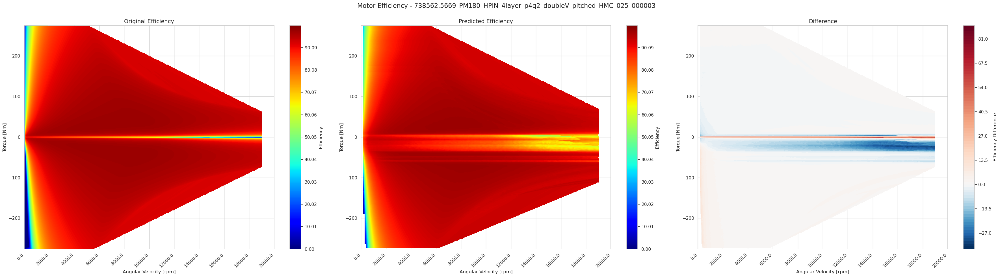

Sample 18:
Original ETA shape: (520, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (520,)
Predicted MM shape: (527,)


<Figure size 2400x2000 with 0 Axes>

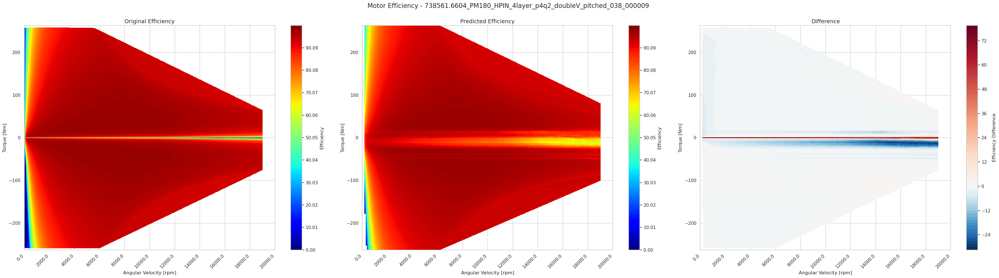

Sample 19:
Original ETA shape: (502, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (502,)
Predicted MM shape: (503,)


<Figure size 2400x2000 with 0 Axes>

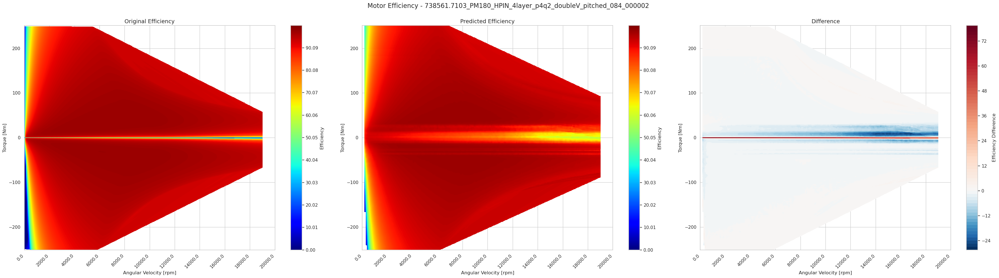

In [24]:
from src.utils import read_file_kpi3d, read_mm_nn
import numpy as np
import matplotlib.pyplot as plt

nn_kpi_2d = list(range(0, 19100, 100))
max_mgrenz_rounded = np.round(max_mgrenz).astype(int)
max_rows = (max_mgrenz_rounded * 2) + 1
nnkpi2darray = np.array(nn_kpi_2d)

max_index = 20

for index_no in range(max_index):
    
    filename_test = df_test_inputs.index[index_no]
    file_path = f'/home/k64889/Masters-Thesis/data/Testing/raw/{filename_test}.xlsx'

    # Read Original MM and ETA data from the Excel file
    mm_kpi3d = np.array(read_mm_nn(file_path, 'MM'))
    eta_kpi3d = read_file_kpi3d(file_path, 'ETA')
    
    eta_predicted = eta_matrix[index_no]
    mm_predicted = np.array(mm[index_no])
    
    print(f"Sample {index_no}:")
    print(f"Original ETA shape: {eta_kpi3d.shape}")
    print(f"Predicted ETA shape: {eta_predicted.shape}")
    print(f"Original MM shape: {mm_kpi3d.shape}")
    print(f"Predicted MM shape: {mm_predicted.shape}")
    
    #Instead of creating a new figure for each plot, add to a grid
    plt.figure(figsize=(24, 20))  # Adjust figure size for all subplots

    # Plot the dual KPI 3D graph
    eval_plot_kpi3d(nnkpi2darray, mm_kpi3d, eta_kpi3d, mm_predicted, eta_predicted, filename_test)

plt.show()

In [25]:
def y2_score(eta1, eta2):
    
    # Convert inputs to float to avoid integer overflow
    # eta1 = eta1.astype(float)
    # eta2 = eta2.astype(float)
    
    if eta1.shape[0] > eta2.shape[0]:
        larger_eta, smaller_eta = eta1, eta2
    else:
        larger_eta, smaller_eta = eta2, eta1
    
    rows, cols = larger_eta.shape
    smaller_rows, smaller_cols = smaller_eta.shape
    
    # Create the interpolated grid
    interpolated_smaller = np.full_like(larger_eta, np.nan)
    
    # Calculate the starting row for placing the smaller eta
    start_row = (rows - smaller_rows) // 2
    
    # Place the smaller eta directly into the middle of the larger grid
    interpolated_smaller[start_row:start_row+smaller_rows, :smaller_cols] = smaller_eta
    
    Z_diff = larger_eta - interpolated_smaller
    
    valid_diff = np.abs(Z_diff[~np.isnan(Z_diff)])
    variance = np.mean(valid_diff ** 2)
    score = np.sqrt(variance)

    return score

In [26]:
from src.utils import read_file_kpi3d
import numpy as np

nn_kpi_2d = list(range(0, 19100, 100))
#nn_kpi_2d = read_mm_nn(file_path, 'NN')
max_mgrenz_rounded = np.round(max_mgrenz).astype(int)
max_rows = (max_mgrenz_rounded * 2) + 1
nnkpi2darray = np.array(nn_kpi_2d)

score=0
max_index = 30

for index_no in range(max_index):
    
    filename_test = df_test_inputs.index[index_no]
    file_path = f'/home/k64889/Masters-Thesis/data/Testing/raw/{filename_test}.xlsx'

    eta_kpi3d = read_file_kpi3d(file_path, 'ETA')
    
    eta_predicted = eta_matrix[index_no]

    score += y2_score(eta_kpi3d,eta_predicted)
    
y2_score = score/max_index
print(f"Average Y2 Score: {y2_score:.4f}")

Average Y2 Score: 7.9765


In [ ]:
Test scoring for y2

In [28]:
import numpy as np

# Sample data
nn = np.arange(0, 600, 100)  # 6 values from 0 to 500

# eta1: larger array (6x6)
eta1 = np.array([[3,6,6,5,5,3],
 [3,6,5,3,3,5],
 [6, 5, 3, 6, 6, 6],
 [5, 3 ,6 ,5, 5, 6]])

# eta2: smaller array (4x4)
eta2 = np.array([[3, 4, 4, 3, 6, 3],
 [5, 6, 6, 6, 5, 6]])


# Run the function
score = y2_score(eta1, eta2)

print(f"Y2 Score: {score}")


Original ETA shape: (4, 6)
Predicted ETA shape: (2, 6)

Interpolated smaller grid:
[[nan nan nan nan nan nan]
 [ 3.  4.  4.  3.  6.  3.]
 [ 5.  6.  6.  6.  5.  6.]
 [nan nan nan nan nan nan]]

Difference grid (Z_diff):
[[nan nan nan nan nan nan]
 [ 0.  2.  1.  0. -3.  2.]
 [ 1. -1. -3.  0.  1.  0.]
 [nan nan nan nan nan nan]]
Y2 Score: 1.5811388300841898


In [ ]:
Eval for y1

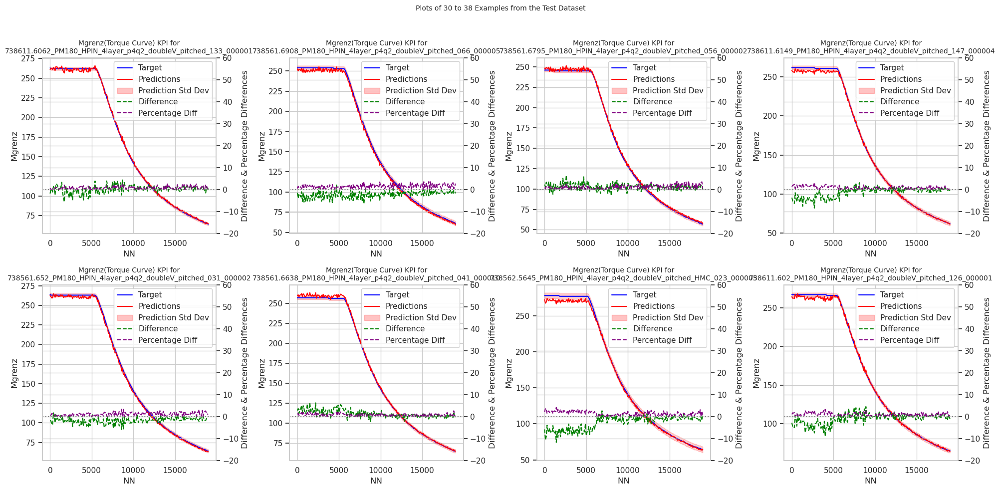

In [42]:
from src.inference import plot_testdataset_kpi2d, plot_mean_std_kpi2d, plot_std_kpi2d, eval_plot_kpi2d
eval_plot_kpi2d(df_test_y1_targets, df_predictions_y1,start=30, end=38, cols=4)

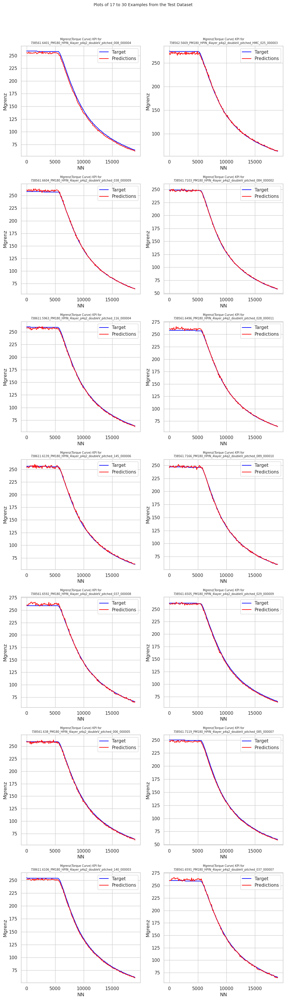

In [29]:
plot_testdataset_kpi2d(df_test_y1_targets, df_predictions_y1,start=17, end=30, cols = 4)

In [ ]:
Plots to draw conclusions from whole test sets

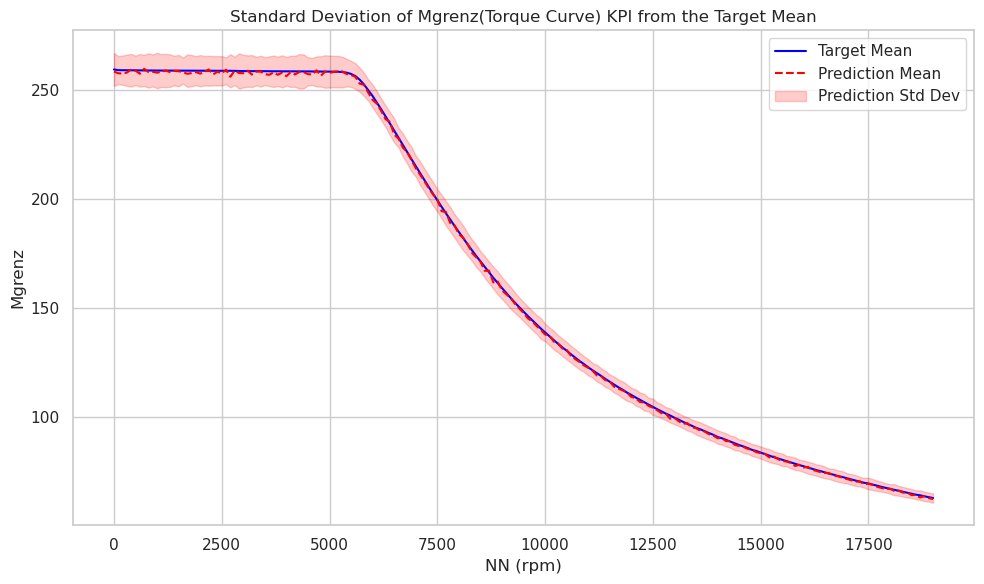

In [30]:
plot_std_kpi2d(df_test_y1_targets, df_predictions_y1)

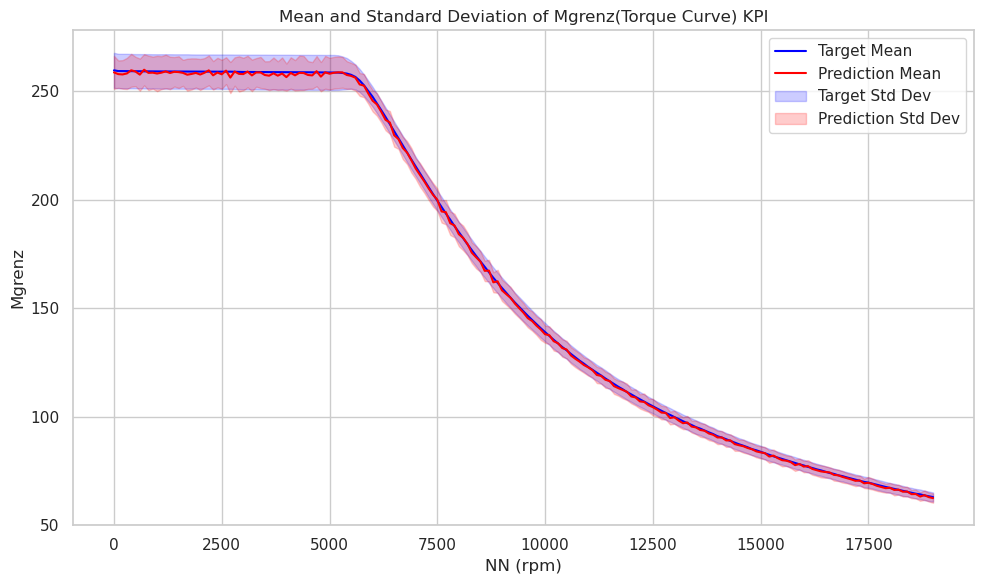

In [31]:
plot_mean_std_kpi2d(df_test_y1_targets, df_predictions_y1)###wrong

In [ ]:
Sklearn metrics

In [33]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, max_error, mean_poisson_deviance, mean_gamma_deviance, mean_absolute_percentage_error, d2_absolute_error_score
import numpy as np

def comprehensive_regression_metrics(df_targets, df_predictions):

    assert df_targets.index.equals(df_predictions.index), "Both target and prediction dfs must have the same index"
    
    metrics_list = []
    for index in df_targets.index:
        y_true = df_targets.loc[index].values
        y_pred = df_predictions.loc[index].values
        
        sample_metrics = {
            "MSE": mean_squared_error(y_true, y_pred),
            "RMSE": np.sqrt(mean_squared_error(y_true, y_pred)),
            "MAE": mean_absolute_error(y_true, y_pred),
            "R2": r2_score(y_true, y_pred),
            "Max Error": max_error(y_true, y_pred),
            "Mean Poisson Deviance": mean_poisson_deviance(y_true, y_pred),
            "Mean Gamma Deviance": mean_gamma_deviance(y_true, y_pred),
            "MAPE": mean_absolute_percentage_error(y_true, y_pred),
            "D2 Absolute Error Score": d2_absolute_error_score(y_true, y_pred)
        }
        metrics_list.append(sample_metrics)
    
    df_metrics = pd.DataFrame(metrics_list, index=df_targets.index)
    return df_metrics

In [35]:
result_metrics = comprehensive_regression_metrics(df_test_y1_targets, df_predictions_y1)
result_metrics

,MSE,RMSE,MAE,R2,Max Error,Mean Poisson Deviance,Mean Gamma Deviance,MAPE,D2 Absolute Error Score
738562.5614_PM180_HPIN_4layer_p4q2_doubleV_pitched_HMC_020_000013,11.532858,3.396006,2.767164,0.998213,9.307281,0.065347,0.000446,0.018181,0.962280
738561.6696_PM180_HPIN_4layer_p4q2_doubleV_pitched_047_000002,5.100788,2.258492,1.547511,0.999097,7.174622,0.022141,0.000113,0.008429,0.977660
738561.65_PM180_HPIN_4layer_p4q2_doubleV_pitched_029_000004,6.856725,2.618535,2.384864,0.998869,5.611420,0.041865,0.000321,0.016059,0.966661
738561.6576_PM180_HPIN_4layer_p4q2_doubleV_pitched_036_000003,3.032949,1.741537,1.396725,0.999478,4.387085,0.017967,0.000134,0.009282,0.980096
738561.6413_PM180_HPIN_4layer_p4q2_doubleV_pitched_009_000005,12.760759,3.572220,3.343611,0.997770,6.791931,0.086822,0.000712,0.023935,0.952055
738561.7001_PM180_HPIN_4layer_p4q2_doubleV_pitched_074_000010,2.371891,1.540095,1.162961,0.999572,5.460693,0.012130,0.000074,0.007063,0.983031
738611.6026_PM180_HPIN_4layer_p4q2_doubleV_pitched_127_000001,4.849437,2.202144,1.602686,0.999215,7.761078,0.022985,0.000131,0.009341,0.977789
738562.5546_PM180_HPIN_4layer_p4q2_doubleV_pitched_HMC_015_000010,9.049293,3.008204,2.241480,0.998672,10.050049,0.042368,0.000239,0.012833,0.970180
738561.6756_PM180_HPIN_4layer_p4q2_doubleV_pitched_052_000007,3.399880,1.843876,1.467938,0.999386,4.882751,0.018797,0.000126,0.009539,0.978528
738561.6858_PM180_HPIN_4layer_p4q2_doubleV_pitched_061_000010,1.592913,1.262106,0.977277,0.999712,3.845612,0.008437,0.000057,0.006371,0.985718


Mgrenz is now taken from training data and MM not calculated coz predicted ETA grid can have only 1 size ie, max size but padded when size is not supposed to be equal